In [4]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import logging

import tensorflow as tf
tf.get_logger().setLevel(logging.ERROR)
from tensorflow.keras import Sequential, Model
from tensorflow.keras import layers as L
from tensorflow.keras import optimizers as op
import tensorflow_io as tfio
from tqdm.notebook import tqdm

from sklearn.model_selection import train_test_split

/root/miniconda3/envs/tfn/lib/python3.9/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/root/miniconda3/envs/tfn/lib/python3.9/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/root/miniconda3/envs/tfn/lib/python3.9/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/root/miniconda3/envs/tfn/lib/python3.9/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/root/miniconda3/envs/tfn/lib/python3.9/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/root/miniconda3/envs/tfn/lib/python3.9/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflo

In [5]:
#splitting the images into test and train
train, val = train_test_split(os.listdir("./lhq_256"), test_size = 0.05,random_state = 32
                              )

train = ["./lhq_256/"+ i for i in train]

val = ["./lhq_256/"+ i for i in val]


def decode_img(img_o):
    """
    Loads the image, converts from rgb to LAB, preprocessing is done to to rescale the images between -1 to 1
    """

    img = tf.image.decode_png(img_o, channels=3,)
    gray = tf.image.rgb_to_grayscale(img)


    img = tf.cast(img, tf.float32) / 255.
    lab = tfio.experimental.color.rgb_to_lab(img,)


    new = tf.concat( [tf.expand_dims((lab[:,:,0] - 50.0 ) / 100.0, axis=-1),  lab[:,:,1:3]  / 128.0], axis=-1)






    gray = tf.cast(gray, tf.float32)/255.

    return new, gray


def process_path(file_path):

  # load the raw data from the file as a string
  img = tf.io.read_file(file_path)
  img, gray = decode_img(img)

  return img[:,:,0], img

In [6]:
len(train), len(val)

(85500, 4500)

In [4]:
#creating train dataset
batch_size = 64
AUTOTUNE = tf.data.AUTOTUNE

train_ds = tf.data.Dataset.from_tensor_slices((train))
train_ds = train_ds.shuffle(40000, reshuffle_each_iteration=True,)
train_ds = train_ds.map((process_path), num_parallel_calls=AUTOTUNE)
# train_ds = train_ds.map(partial(set_shapes,img_shape=(256,256,3)),num_parallel_calls=AUTOTUNE)
train_ds = train_ds.batch(batch_size).prefetch(buffer_size=AUTOTUNE)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


In [ ]:
# creating val dataset
val_ds = tf.data.Dataset.from_tensor_slices((val))
val_ds = val_ds.map((process_path), num_parallel_calls=AUTOTUNE)
val_ds = val_ds.batch(batch_size).prefetch(buffer_size=AUTOTUNE)

In [8]:
def downsample_block(filters, size, bn=True, initializer="he_normal"):
  # l1 = L.Conv2D(filters, size, strides=2, padding="same", kernel_initializer=initializer, use_bias=False)
  # if bn:
  #   l1 = L.BatchNormalization()(l1)
  # l1 = L.LeakyReLU()(l1)

  # block1 = Model(inputs=[l1.input], outputs=[l1])


  model = Sequential()
  model.add(L.Conv2D(filters, size, strides=2, padding="same", kernel_initializer=initializer, use_bias=False))
  if bn:
    model.add( L.BatchNormalization())
  model.add(L.LeakyReLU())

  return model

In [9]:
def upsample_block(filters, size, dropout=False):
  model = Sequential()
  model.add(L.Conv2DTranspose(filters, size, strides=2, padding="same", kernel_initializer="he_normal", use_bias=False))
  model.add(L.BatchNormalization())
  if dropout:
    model.add(L.Dropout(0.3))
  model.add(L.LeakyReLU(0.2))

  return model

In [10]:
#takes input the L channel, predicts the a and b channel
inputs = L.Input(shape=[256, 256, 1])


down_layers = [
    downsample_block(32,4, bn=False), #128
    downsample_block(32,4), #64
    downsample_block(64,4), #32
    downsample_block(64,4), #16
    downsample_block(128,4), #8
    downsample_block(128,4), #4
    downsample_block(128,4), #2
    downsample_block(128,4), #1
]


up_layers = [
    upsample_block(128,4, dropout=True), #2
    upsample_block(128,4, dropout=True),#4
    upsample_block(128,4, dropout=True), #8
    upsample_block(64,4), #16
    upsample_block(64,4), #32
    upsample_block(32,4), #64
    upsample_block(32,4), #128
]

out = L.Conv2DTranspose(2,4, strides=2,padding="same", kernel_initializer="he_normal", activation="tanh") #256,256,2


In [11]:
x = inputs

skips = []
for  down in down_layers:
  x = down(x)
  skips.append(x)
skips = reversed(skips[:-1])
for up, skip in zip(up_layers, skips):
  x = up(x)
  x = L.Concatenate()([x,skip])
x = out(x)



generator = Model(inputs, x)

In [12]:
#Discriminator

inp = L.Input(shape=(256,256,2))

l1 = L.Conv2D(64, 4,2, padding="same", kernel_initializer ="he_normal" )(inp)
l1 = L.BatchNormalization()(l1)
l1 = L.LeakyReLU(0.2)(l1)
l1 = L.Dropout(0.4)(l1)

l2 = L.Conv2D(64,4,2, padding="same", kernel_initializer ="he_normal")(l1)
l2 = L.BatchNormalization()(l2)
l2 = L.LeakyReLU(0.2)(l2)
l2 = L.Dropout(0.4)(l2)

l2 = L.Conv2D(128,4,2, padding="same", kernel_initializer ="he_normal")(l2)
l2 = L.BatchNormalization()(l2)
l2 = L.LeakyReLU(0.4)(l2)
# l2 = L.Dropout(0.2)(l2)


l2 = L.Conv2D(64,4,2, padding="same", kernel_initializer ="he_normal")(l2)
l2 = L.BatchNormalization()(l2)
l2 = L.LeakyReLU(0.4)(l2)
# l2 = L.Dropout(0.2)(l2)

l2 = L.Conv2D(1,4,2, padding="same", kernel_initializer ="he_normal")(l2)
l2 = L.BatchNormalization()(l2)
l2 = L.LeakyReLU(0.4)(l2)

l3 = L.Flatten()(l2)
# l3 = L.Dense(256, activation="relu")(l3)
# l3 = L.Dropout(0.2)(l3)
l4 = L.Dense(1, activation="sigmoid")(l3)

disc_model  = Model(inputs=[inp], outputs=[l4])

disc_model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 256, 256, 2)]     0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 128, 128, 64)      2112      
_________________________________________________________________
batch_normalization_14 (Batc (None, 128, 128, 64)      256       
_________________________________________________________________
leaky_re_lu_15 (LeakyReLU)   (None, 128, 128, 64)      0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 64, 64, 64)        65600     
_________________________________________________________________
batch_normalization_15 (Batc (None, 64, 64, 64)        256 

# Training


In [11]:
epochs=1000
n_disc = 2 # no. of times to train discriminator in one cycle
loss_fn = tf.keras.losses.BinaryCrossentropy() #Classification Loss
loss_fn2 = tf.keras.losses.MeanSquaredError() #Reconstruction Loss


gen_optimizer = op.Adam(1e-4,0.5)
gen_loss_metric = tf.keras.metrics.Mean(name="gen_loss")

disc_model.compile(loss="binary_crossentropy", optimizer = op.Adam(1e-4, 0.5), metrics=["accuracy"])

In [ ]:
import warnings
warnings.filterwarnings("ignore")

lamda = 100
for epoch in tqdm(range(epochs), leave=True):
  c=0
  for n,(gray, color) in tqdm(enumerate(train_ds), leave=False, total=len(train_ds)):
    gray = tf.expand_dims(gray, axis=-1)
    bs = tf.shape(color)[0]

    if c<n_disc:
      disc_model.trainable = True

      disc_loss_real, real_acc = disc_model.train_on_batch(color[:,:,:,1:3], tf.ones((bs, 1)) - 0.1 )

      gen_output = generator(gray)
      gen_final = gen_output #tf.concat([gray, gen_output], axis=-1)

      disc_loss_fake ,fake_acc = disc_model.train_on_batch(gen_final, tf.zeros((bs, 1)) + 0.1)
      d_loss =  (disc_loss_real + disc_loss_fake) / 2

      c+=1
    if c == n_disc:
      c=0

      disc_model.trainable = False
      

      gen_labels  = tf.ones(shape = (bs,1) ) - 0.1
      
      with tf.GradientTape() as tape:
        gen_images = generator(gray)
        gen_final = gen_images #tf.concat([gray, gen_images], axis=-1)
        disc_pred = disc_model(gen_final)
        gen_loss = loss_fn(gen_labels, disc_pred)

        gen_loss2 = lamda * loss_fn2(gen_images, color[:,:,:,1:3])

        gen_loss = gen_loss + gen_loss2



      grads = tape.gradient(gen_loss, generator.trainable_weights)
      gen_optimizer.apply_gradients(zip(grads, generator.trainable_weights))

      gen_loss_metric.update_state(gen_loss)


      print ("%d [D loss: %f] [G loss: %f] [Real_acc: %f] [Fake_acc: %f]" % (epoch, d_loss, gen_loss, real_acc, fake_acc ))


    if n % 50 ==0:
      gen_imgs = generator.predict(gray, verbose=0)
      gen_final = tf.concat([gray, gen_imgs], axis=-1).numpy()

      gen_final[:,:,:,0] =  ((gen_final[:,:,:,0]) * 50)+50
      gen_final[:,:,:,1:3] =  ((gen_final[:,:,:,1:3]) * 128)

      gen_imgs = np.array([tfio.experimental.color.lab_to_rgb(img,) for img in gen_final])
      

      r,col = 4,4
      fig, axs = plt.subplots(r, col, figsize=(10,10))
      cnt = 0
      for i in range(r):
          for j in range(col):
              axs[i,j].imshow(gen_imgs[cnt, :,:,:],)
              axs[i,j].axis('off')
              cnt += 1
      fig.savefig(f"./images/gan{epoch}_{n}.png")
      plt.close()
  generator.save_weights(f"weights/generator_{epoch}.h5")
  disc_model.save_weights(f"weights/disc_{epoch}.h5")






  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1336 [00:00<?, ?it/s]

0 [D loss: 0.821176] [G loss: 24.941956] [Real_acc: 0.000000] [Fake_acc: 0.000000]
0 [D loss: 0.769645] [G loss: 22.164364] [Real_acc: 0.000000] [Fake_acc: 0.000000]
0 [D loss: 0.697471] [G loss: 21.412260] [Real_acc: 0.000000] [Fake_acc: 0.000000]
0 [D loss: 0.763094] [G loss: 20.241035] [Real_acc: 0.000000] [Fake_acc: 0.000000]
0 [D loss: 0.722030] [G loss: 19.786131] [Real_acc: 0.000000] [Fake_acc: 0.000000]
0 [D loss: 0.663460] [G loss: 18.688799] [Real_acc: 0.000000] [Fake_acc: 0.000000]
0 [D loss: 0.694956] [G loss: 18.189135] [Real_acc: 0.000000] [Fake_acc: 0.000000]
0 [D loss: 0.704296] [G loss: 17.837343] [Real_acc: 0.000000] [Fake_acc: 0.000000]
0 [D loss: 0.726106] [G loss: 15.335238] [Real_acc: 0.000000] [Fake_acc: 0.000000]
0 [D loss: 0.706521] [G loss: 14.890338] [Real_acc: 0.000000] [Fake_acc: 0.000000]
0 [D loss: 0.699565] [G loss: 15.223807] [Real_acc: 0.000000] [Fake_acc: 0.000000]
0 [D loss: 0.696335] [G loss: 14.730563] [Real_acc: 0.000000] [Fake_acc: 0.000000]
0 [D

  0%|          | 0/1336 [00:00<?, ?it/s]

1 [D loss: 0.327548] [G loss: 2.686661] [Real_acc: 0.000000] [Fake_acc: 0.000000]
1 [D loss: 0.328465] [G loss: 2.936547] [Real_acc: 0.000000] [Fake_acc: 0.000000]
1 [D loss: 0.330373] [G loss: 2.749177] [Real_acc: 0.000000] [Fake_acc: 0.000000]
1 [D loss: 0.328526] [G loss: 3.241054] [Real_acc: 0.000000] [Fake_acc: 0.000000]
1 [D loss: 0.329181] [G loss: 3.011676] [Real_acc: 0.000000] [Fake_acc: 0.000000]
1 [D loss: 0.329793] [G loss: 2.614998] [Real_acc: 0.000000] [Fake_acc: 0.000000]
1 [D loss: 0.328198] [G loss: 2.711012] [Real_acc: 0.000000] [Fake_acc: 0.000000]
1 [D loss: 0.327998] [G loss: 3.053016] [Real_acc: 0.000000] [Fake_acc: 0.000000]
1 [D loss: 0.328721] [G loss: 2.965730] [Real_acc: 0.000000] [Fake_acc: 0.000000]
1 [D loss: 0.327758] [G loss: 2.923223] [Real_acc: 0.000000] [Fake_acc: 0.000000]
1 [D loss: 0.327671] [G loss: 2.925463] [Real_acc: 0.000000] [Fake_acc: 0.000000]
1 [D loss: 0.327668] [G loss: 2.473154] [Real_acc: 0.000000] [Fake_acc: 0.000000]
1 [D loss: 0.328

  0%|          | 0/1336 [00:00<?, ?it/s]

2 [D loss: 0.325993] [G loss: 2.413895] [Real_acc: 0.000000] [Fake_acc: 0.000000]
2 [D loss: 0.325807] [G loss: 2.528309] [Real_acc: 0.000000] [Fake_acc: 0.000000]
2 [D loss: 0.325692] [G loss: 2.183311] [Real_acc: 0.000000] [Fake_acc: 0.000000]
2 [D loss: 0.325630] [G loss: 1.980696] [Real_acc: 0.000000] [Fake_acc: 0.000000]
2 [D loss: 0.325661] [G loss: 2.225189] [Real_acc: 0.000000] [Fake_acc: 0.000000]
2 [D loss: 0.325820] [G loss: 2.127919] [Real_acc: 0.000000] [Fake_acc: 0.000000]
2 [D loss: 0.325647] [G loss: 2.231690] [Real_acc: 0.000000] [Fake_acc: 0.000000]
2 [D loss: 0.325717] [G loss: 2.032780] [Real_acc: 0.000000] [Fake_acc: 0.000000]
2 [D loss: 0.325633] [G loss: 2.332843] [Real_acc: 0.000000] [Fake_acc: 0.000000]
2 [D loss: 0.325657] [G loss: 2.138140] [Real_acc: 0.000000] [Fake_acc: 0.000000]
2 [D loss: 0.325814] [G loss: 2.295045] [Real_acc: 0.000000] [Fake_acc: 0.000000]
2 [D loss: 0.325694] [G loss: 2.287189] [Real_acc: 0.000000] [Fake_acc: 0.000000]
2 [D loss: 0.325

  0%|          | 0/1336 [00:00<?, ?it/s]

3 [D loss: 0.325446] [G loss: 2.051909] [Real_acc: 0.000000] [Fake_acc: 0.000000]
3 [D loss: 0.325431] [G loss: 2.318396] [Real_acc: 0.000000] [Fake_acc: 0.000000]
3 [D loss: 0.325278] [G loss: 1.996593] [Real_acc: 0.000000] [Fake_acc: 0.000000]
3 [D loss: 0.325591] [G loss: 2.038740] [Real_acc: 0.000000] [Fake_acc: 0.000000]
3 [D loss: 0.325290] [G loss: 2.027571] [Real_acc: 0.000000] [Fake_acc: 0.000000]
3 [D loss: 0.325306] [G loss: 2.165642] [Real_acc: 0.000000] [Fake_acc: 0.000000]
3 [D loss: 0.325350] [G loss: 1.997209] [Real_acc: 0.000000] [Fake_acc: 0.000000]
3 [D loss: 0.325436] [G loss: 1.771468] [Real_acc: 0.000000] [Fake_acc: 0.000000]
3 [D loss: 0.325382] [G loss: 2.039953] [Real_acc: 0.000000] [Fake_acc: 0.000000]
3 [D loss: 0.325353] [G loss: 1.969208] [Real_acc: 0.000000] [Fake_acc: 0.000000]
3 [D loss: 0.325337] [G loss: 1.913821] [Real_acc: 0.000000] [Fake_acc: 0.000000]
3 [D loss: 0.325342] [G loss: 1.778181] [Real_acc: 0.000000] [Fake_acc: 0.000000]
3 [D loss: 0.325

  0%|          | 0/1336 [00:00<?, ?it/s]

4 [D loss: 0.325698] [G loss: 1.541306] [Real_acc: 0.000000] [Fake_acc: 0.000000]
4 [D loss: 0.325692] [G loss: 1.890174] [Real_acc: 0.000000] [Fake_acc: 0.000000]
4 [D loss: 0.325955] [G loss: 1.990369] [Real_acc: 0.000000] [Fake_acc: 0.000000]
4 [D loss: 0.325547] [G loss: 1.837666] [Real_acc: 0.000000] [Fake_acc: 0.000000]
4 [D loss: 0.325663] [G loss: 1.986631] [Real_acc: 0.000000] [Fake_acc: 0.000000]
4 [D loss: 0.325682] [G loss: 1.763828] [Real_acc: 0.000000] [Fake_acc: 0.000000]
4 [D loss: 0.325478] [G loss: 1.813470] [Real_acc: 0.000000] [Fake_acc: 0.000000]
4 [D loss: 0.325613] [G loss: 1.825146] [Real_acc: 0.000000] [Fake_acc: 0.000000]
4 [D loss: 0.325688] [G loss: 1.934219] [Real_acc: 0.000000] [Fake_acc: 0.000000]
4 [D loss: 0.325627] [G loss: 1.958264] [Real_acc: 0.000000] [Fake_acc: 0.000000]
4 [D loss: 0.325605] [G loss: 1.929426] [Real_acc: 0.000000] [Fake_acc: 0.000000]
4 [D loss: 0.325912] [G loss: 1.810022] [Real_acc: 0.000000] [Fake_acc: 0.000000]
4 [D loss: 0.325

  0%|          | 0/1336 [00:00<?, ?it/s]

5 [D loss: 0.325166] [G loss: 1.831026] [Real_acc: 0.000000] [Fake_acc: 0.000000]
5 [D loss: 0.325219] [G loss: 1.878781] [Real_acc: 0.000000] [Fake_acc: 0.000000]
5 [D loss: 0.325208] [G loss: 1.959465] [Real_acc: 0.000000] [Fake_acc: 0.000000]
5 [D loss: 0.325177] [G loss: 1.874042] [Real_acc: 0.000000] [Fake_acc: 0.000000]
5 [D loss: 0.325185] [G loss: 1.851194] [Real_acc: 0.000000] [Fake_acc: 0.000000]
5 [D loss: 0.325203] [G loss: 2.014588] [Real_acc: 0.000000] [Fake_acc: 0.000000]
5 [D loss: 0.325146] [G loss: 1.724379] [Real_acc: 0.000000] [Fake_acc: 0.000000]
5 [D loss: 0.325197] [G loss: 1.596272] [Real_acc: 0.000000] [Fake_acc: 0.000000]
5 [D loss: 0.325159] [G loss: 1.719330] [Real_acc: 0.000000] [Fake_acc: 0.000000]
5 [D loss: 0.325161] [G loss: 1.862863] [Real_acc: 0.000000] [Fake_acc: 0.000000]
5 [D loss: 0.325184] [G loss: 1.705433] [Real_acc: 0.000000] [Fake_acc: 0.000000]
5 [D loss: 0.325190] [G loss: 1.896317] [Real_acc: 0.000000] [Fake_acc: 0.000000]
5 [D loss: 0.325

  0%|          | 0/1336 [00:00<?, ?it/s]

6 [D loss: 0.325192] [G loss: 1.755931] [Real_acc: 0.000000] [Fake_acc: 0.000000]
6 [D loss: 0.325173] [G loss: 2.052309] [Real_acc: 0.000000] [Fake_acc: 0.000000]
6 [D loss: 0.325199] [G loss: 1.547085] [Real_acc: 0.000000] [Fake_acc: 0.000000]
6 [D loss: 0.325158] [G loss: 1.739448] [Real_acc: 0.000000] [Fake_acc: 0.000000]
6 [D loss: 0.325154] [G loss: 1.952409] [Real_acc: 0.000000] [Fake_acc: 0.000000]
6 [D loss: 0.325262] [G loss: 1.533424] [Real_acc: 0.000000] [Fake_acc: 0.000000]
6 [D loss: 0.325148] [G loss: 1.719310] [Real_acc: 0.000000] [Fake_acc: 0.000000]
6 [D loss: 0.325167] [G loss: 1.677625] [Real_acc: 0.000000] [Fake_acc: 0.000000]
6 [D loss: 0.325162] [G loss: 1.993275] [Real_acc: 0.000000] [Fake_acc: 0.000000]
6 [D loss: 0.325183] [G loss: 1.725270] [Real_acc: 0.000000] [Fake_acc: 0.000000]
6 [D loss: 0.325180] [G loss: 1.642609] [Real_acc: 0.000000] [Fake_acc: 0.000000]
6 [D loss: 0.325148] [G loss: 1.720744] [Real_acc: 0.000000] [Fake_acc: 0.000000]
6 [D loss: 0.325

  0%|          | 0/1336 [00:00<?, ?it/s]

7 [D loss: 0.325131] [G loss: 1.660738] [Real_acc: 0.000000] [Fake_acc: 0.000000]
7 [D loss: 0.325128] [G loss: 1.753275] [Real_acc: 0.000000] [Fake_acc: 0.000000]
7 [D loss: 0.325122] [G loss: 1.677051] [Real_acc: 0.000000] [Fake_acc: 0.000000]
7 [D loss: 0.325115] [G loss: 1.977451] [Real_acc: 0.000000] [Fake_acc: 0.000000]
7 [D loss: 0.325141] [G loss: 1.715153] [Real_acc: 0.000000] [Fake_acc: 0.000000]
7 [D loss: 0.325175] [G loss: 2.009034] [Real_acc: 0.000000] [Fake_acc: 0.000000]
7 [D loss: 0.325149] [G loss: 1.488869] [Real_acc: 0.000000] [Fake_acc: 0.000000]
7 [D loss: 0.325136] [G loss: 1.716984] [Real_acc: 0.000000] [Fake_acc: 0.000000]
7 [D loss: 0.325131] [G loss: 1.606531] [Real_acc: 0.000000] [Fake_acc: 0.000000]
7 [D loss: 0.325119] [G loss: 1.794442] [Real_acc: 0.000000] [Fake_acc: 0.000000]
7 [D loss: 0.325146] [G loss: 1.880434] [Real_acc: 0.000000] [Fake_acc: 0.000000]
7 [D loss: 0.325134] [G loss: 1.502873] [Real_acc: 0.000000] [Fake_acc: 0.000000]
7 [D loss: 0.325

  0%|          | 0/1336 [00:00<?, ?it/s]

8 [D loss: 0.325129] [G loss: 1.875674] [Real_acc: 0.000000] [Fake_acc: 0.000000]
8 [D loss: 0.325109] [G loss: 1.686601] [Real_acc: 0.000000] [Fake_acc: 0.000000]
8 [D loss: 0.325110] [G loss: 2.026018] [Real_acc: 0.000000] [Fake_acc: 0.000000]
8 [D loss: 0.325139] [G loss: 1.739906] [Real_acc: 0.000000] [Fake_acc: 0.000000]
8 [D loss: 0.325121] [G loss: 1.845011] [Real_acc: 0.000000] [Fake_acc: 0.000000]
8 [D loss: 0.325189] [G loss: 1.398344] [Real_acc: 0.000000] [Fake_acc: 0.000000]
8 [D loss: 0.325170] [G loss: 1.454873] [Real_acc: 0.000000] [Fake_acc: 0.000000]
8 [D loss: 0.325119] [G loss: 1.680385] [Real_acc: 0.000000] [Fake_acc: 0.000000]
8 [D loss: 0.325113] [G loss: 1.602995] [Real_acc: 0.000000] [Fake_acc: 0.000000]
8 [D loss: 0.325127] [G loss: 1.791685] [Real_acc: 0.000000] [Fake_acc: 0.000000]
8 [D loss: 0.325137] [G loss: 1.923994] [Real_acc: 0.000000] [Fake_acc: 0.000000]
8 [D loss: 0.325233] [G loss: 2.116053] [Real_acc: 0.000000] [Fake_acc: 0.000000]
8 [D loss: 0.367

  0%|          | 0/1336 [00:00<?, ?it/s]

9 [D loss: 0.325143] [G loss: 1.533728] [Real_acc: 0.000000] [Fake_acc: 0.000000]
9 [D loss: 0.325129] [G loss: 1.641357] [Real_acc: 0.000000] [Fake_acc: 0.000000]
9 [D loss: 0.325134] [G loss: 1.428862] [Real_acc: 0.000000] [Fake_acc: 0.000000]
9 [D loss: 0.325141] [G loss: 1.376415] [Real_acc: 0.000000] [Fake_acc: 0.000000]
9 [D loss: 0.325131] [G loss: 1.370488] [Real_acc: 0.000000] [Fake_acc: 0.000000]
9 [D loss: 0.325137] [G loss: 1.332265] [Real_acc: 0.000000] [Fake_acc: 0.000000]
9 [D loss: 0.325132] [G loss: 1.530783] [Real_acc: 0.000000] [Fake_acc: 0.000000]
9 [D loss: 0.325139] [G loss: 1.436971] [Real_acc: 0.000000] [Fake_acc: 0.000000]
9 [D loss: 0.325136] [G loss: 1.445146] [Real_acc: 0.000000] [Fake_acc: 0.000000]
9 [D loss: 0.325146] [G loss: 1.573153] [Real_acc: 0.000000] [Fake_acc: 0.000000]
9 [D loss: 0.325135] [G loss: 1.375311] [Real_acc: 0.000000] [Fake_acc: 0.000000]
9 [D loss: 0.325148] [G loss: 1.709746] [Real_acc: 0.000000] [Fake_acc: 0.000000]
9 [D loss: 0.325

  0%|          | 0/1336 [00:00<?, ?it/s]

10 [D loss: 0.325108] [G loss: 1.655416] [Real_acc: 0.000000] [Fake_acc: 0.000000]
10 [D loss: 0.325146] [G loss: 1.445314] [Real_acc: 0.000000] [Fake_acc: 0.000000]
10 [D loss: 0.325111] [G loss: 1.537611] [Real_acc: 0.000000] [Fake_acc: 0.000000]
10 [D loss: 0.325119] [G loss: 1.309436] [Real_acc: 0.000000] [Fake_acc: 0.000000]
10 [D loss: 0.325154] [G loss: 1.429950] [Real_acc: 0.000000] [Fake_acc: 0.000000]
10 [D loss: 0.325121] [G loss: 1.597744] [Real_acc: 0.000000] [Fake_acc: 0.000000]
10 [D loss: 0.325125] [G loss: 1.452931] [Real_acc: 0.000000] [Fake_acc: 0.000000]
10 [D loss: 0.325128] [G loss: 1.468207] [Real_acc: 0.000000] [Fake_acc: 0.000000]
10 [D loss: 0.325109] [G loss: 1.643510] [Real_acc: 0.000000] [Fake_acc: 0.000000]
10 [D loss: 0.325130] [G loss: 1.511881] [Real_acc: 0.000000] [Fake_acc: 0.000000]
10 [D loss: 0.325103] [G loss: 1.546353] [Real_acc: 0.000000] [Fake_acc: 0.000000]
10 [D loss: 0.325131] [G loss: 1.746727] [Real_acc: 0.000000] [Fake_acc: 0.000000]
10 [

  0%|          | 0/1336 [00:00<?, ?it/s]

11 [D loss: 0.326352] [G loss: 1.761718] [Real_acc: 0.000000] [Fake_acc: 0.000000]
11 [D loss: 0.325328] [G loss: 1.723024] [Real_acc: 0.000000] [Fake_acc: 0.000000]
11 [D loss: 0.325225] [G loss: 1.583118] [Real_acc: 0.000000] [Fake_acc: 0.000000]
11 [D loss: 0.325185] [G loss: 1.502727] [Real_acc: 0.000000] [Fake_acc: 0.000000]
11 [D loss: 0.325255] [G loss: 1.586287] [Real_acc: 0.000000] [Fake_acc: 0.000000]
11 [D loss: 0.325195] [G loss: 1.516064] [Real_acc: 0.000000] [Fake_acc: 0.000000]
11 [D loss: 0.325226] [G loss: 1.480412] [Real_acc: 0.000000] [Fake_acc: 0.000000]
11 [D loss: 0.325245] [G loss: 1.598107] [Real_acc: 0.000000] [Fake_acc: 0.000000]
11 [D loss: 0.326678] [G loss: 1.498010] [Real_acc: 0.000000] [Fake_acc: 0.000000]
11 [D loss: 0.325199] [G loss: 1.605071] [Real_acc: 0.000000] [Fake_acc: 0.000000]
11 [D loss: 0.325233] [G loss: 1.599252] [Real_acc: 0.000000] [Fake_acc: 0.000000]
11 [D loss: 0.325189] [G loss: 1.496807] [Real_acc: 0.000000] [Fake_acc: 0.000000]
11 [

  0%|          | 0/1336 [00:00<?, ?it/s]

12 [D loss: 0.325113] [G loss: 1.679272] [Real_acc: 0.000000] [Fake_acc: 0.000000]
12 [D loss: 0.325110] [G loss: 1.718754] [Real_acc: 0.000000] [Fake_acc: 0.000000]
12 [D loss: 0.325109] [G loss: 1.467587] [Real_acc: 0.000000] [Fake_acc: 0.000000]
12 [D loss: 0.325108] [G loss: 1.536834] [Real_acc: 0.000000] [Fake_acc: 0.000000]
12 [D loss: 0.325112] [G loss: 1.573215] [Real_acc: 0.000000] [Fake_acc: 0.000000]
12 [D loss: 0.325110] [G loss: 1.743202] [Real_acc: 0.000000] [Fake_acc: 0.000000]
12 [D loss: 0.325110] [G loss: 1.391346] [Real_acc: 0.000000] [Fake_acc: 0.000000]
12 [D loss: 0.325122] [G loss: 1.624637] [Real_acc: 0.000000] [Fake_acc: 0.000000]
12 [D loss: 0.325116] [G loss: 1.592467] [Real_acc: 0.000000] [Fake_acc: 0.000000]
12 [D loss: 0.325100] [G loss: 1.672472] [Real_acc: 0.000000] [Fake_acc: 0.000000]
12 [D loss: 0.325118] [G loss: 1.706389] [Real_acc: 0.000000] [Fake_acc: 0.000000]
12 [D loss: 0.325120] [G loss: 1.475402] [Real_acc: 0.000000] [Fake_acc: 0.000000]
12 [

  0%|          | 0/1336 [00:00<?, ?it/s]

13 [D loss: 0.325102] [G loss: 1.693230] [Real_acc: 0.000000] [Fake_acc: 0.000000]
13 [D loss: 0.325103] [G loss: 1.397769] [Real_acc: 0.000000] [Fake_acc: 0.000000]
13 [D loss: 0.325111] [G loss: 1.562689] [Real_acc: 0.000000] [Fake_acc: 0.000000]
13 [D loss: 0.325100] [G loss: 1.435062] [Real_acc: 0.000000] [Fake_acc: 0.000000]
13 [D loss: 0.325104] [G loss: 1.580007] [Real_acc: 0.000000] [Fake_acc: 0.000000]
13 [D loss: 0.325111] [G loss: 1.409232] [Real_acc: 0.000000] [Fake_acc: 0.000000]
13 [D loss: 0.325145] [G loss: 1.424148] [Real_acc: 0.000000] [Fake_acc: 0.000000]
13 [D loss: 0.325121] [G loss: 1.474898] [Real_acc: 0.000000] [Fake_acc: 0.000000]
13 [D loss: 0.325108] [G loss: 2.141976] [Real_acc: 0.000000] [Fake_acc: 0.000000]
13 [D loss: 0.325104] [G loss: 1.629956] [Real_acc: 0.000000] [Fake_acc: 0.000000]
13 [D loss: 0.325120] [G loss: 1.662194] [Real_acc: 0.000000] [Fake_acc: 0.000000]
13 [D loss: 0.325106] [G loss: 1.556129] [Real_acc: 0.000000] [Fake_acc: 0.000000]
13 [

  0%|          | 0/1336 [00:00<?, ?it/s]

14 [D loss: 0.325184] [G loss: 1.436387] [Real_acc: 0.000000] [Fake_acc: 0.000000]
14 [D loss: 0.325219] [G loss: 1.365338] [Real_acc: 0.000000] [Fake_acc: 0.000000]
14 [D loss: 0.325249] [G loss: 1.573865] [Real_acc: 0.000000] [Fake_acc: 0.000000]
14 [D loss: 0.325219] [G loss: 1.406304] [Real_acc: 0.000000] [Fake_acc: 0.000000]
14 [D loss: 0.325170] [G loss: 1.303264] [Real_acc: 0.000000] [Fake_acc: 0.000000]
14 [D loss: 0.325258] [G loss: 1.462351] [Real_acc: 0.000000] [Fake_acc: 0.000000]
14 [D loss: 0.325203] [G loss: 1.487507] [Real_acc: 0.000000] [Fake_acc: 0.000000]
14 [D loss: 0.325238] [G loss: 1.278495] [Real_acc: 0.000000] [Fake_acc: 0.000000]
14 [D loss: 0.325239] [G loss: 1.591200] [Real_acc: 0.000000] [Fake_acc: 0.000000]
14 [D loss: 0.325193] [G loss: 1.260067] [Real_acc: 0.000000] [Fake_acc: 0.000000]
14 [D loss: 0.325162] [G loss: 1.455458] [Real_acc: 0.000000] [Fake_acc: 0.000000]
14 [D loss: 0.325246] [G loss: 1.302895] [Real_acc: 0.000000] [Fake_acc: 0.000000]
14 [

  0%|          | 0/1336 [00:00<?, ?it/s]

15 [D loss: 0.325114] [G loss: 1.477956] [Real_acc: 0.000000] [Fake_acc: 0.000000]
15 [D loss: 0.325121] [G loss: 1.401895] [Real_acc: 0.000000] [Fake_acc: 0.000000]
15 [D loss: 0.325110] [G loss: 1.419807] [Real_acc: 0.000000] [Fake_acc: 0.000000]
15 [D loss: 0.325113] [G loss: 1.430595] [Real_acc: 0.000000] [Fake_acc: 0.000000]
15 [D loss: 0.325111] [G loss: 1.355471] [Real_acc: 0.000000] [Fake_acc: 0.000000]
15 [D loss: 0.325126] [G loss: 1.298230] [Real_acc: 0.000000] [Fake_acc: 0.000000]
15 [D loss: 0.325116] [G loss: 1.351960] [Real_acc: 0.000000] [Fake_acc: 0.000000]
15 [D loss: 0.325119] [G loss: 1.470141] [Real_acc: 0.000000] [Fake_acc: 0.000000]
15 [D loss: 0.325111] [G loss: 1.530963] [Real_acc: 0.000000] [Fake_acc: 0.000000]
15 [D loss: 0.325130] [G loss: 1.356267] [Real_acc: 0.000000] [Fake_acc: 0.000000]
15 [D loss: 0.325206] [G loss: 1.554839] [Real_acc: 0.000000] [Fake_acc: 0.000000]
15 [D loss: 0.325272] [G loss: 1.211972] [Real_acc: 0.000000] [Fake_acc: 0.000000]
15 [

  0%|          | 0/1336 [00:00<?, ?it/s]

16 [D loss: 0.325111] [G loss: 1.345685] [Real_acc: 0.000000] [Fake_acc: 0.000000]
16 [D loss: 0.325113] [G loss: 1.344608] [Real_acc: 0.000000] [Fake_acc: 0.000000]
16 [D loss: 0.325109] [G loss: 1.661950] [Real_acc: 0.000000] [Fake_acc: 0.000000]
16 [D loss: 0.325120] [G loss: 1.454190] [Real_acc: 0.000000] [Fake_acc: 0.000000]
16 [D loss: 0.325113] [G loss: 1.409420] [Real_acc: 0.000000] [Fake_acc: 0.000000]
16 [D loss: 0.325105] [G loss: 1.367250] [Real_acc: 0.000000] [Fake_acc: 0.000000]
16 [D loss: 0.325105] [G loss: 1.466701] [Real_acc: 0.000000] [Fake_acc: 0.000000]
16 [D loss: 0.325113] [G loss: 1.411428] [Real_acc: 0.000000] [Fake_acc: 0.000000]
16 [D loss: 0.325101] [G loss: 1.595840] [Real_acc: 0.000000] [Fake_acc: 0.000000]
16 [D loss: 0.325117] [G loss: 1.489325] [Real_acc: 0.000000] [Fake_acc: 0.000000]
16 [D loss: 0.325109] [G loss: 1.904385] [Real_acc: 0.000000] [Fake_acc: 0.000000]
16 [D loss: 0.325115] [G loss: 1.280871] [Real_acc: 0.000000] [Fake_acc: 0.000000]
16 [

  0%|          | 0/1336 [00:00<?, ?it/s]

17 [D loss: 0.325305] [G loss: 1.633978] [Real_acc: 0.000000] [Fake_acc: 0.000000]
17 [D loss: 0.325277] [G loss: 1.649029] [Real_acc: 0.000000] [Fake_acc: 0.000000]
17 [D loss: 0.325238] [G loss: 1.714675] [Real_acc: 0.000000] [Fake_acc: 0.000000]
17 [D loss: 0.325204] [G loss: 1.574281] [Real_acc: 0.000000] [Fake_acc: 0.000000]
17 [D loss: 0.325215] [G loss: 1.428211] [Real_acc: 0.000000] [Fake_acc: 0.000000]
17 [D loss: 0.325209] [G loss: 1.476258] [Real_acc: 0.000000] [Fake_acc: 0.000000]
17 [D loss: 0.325185] [G loss: 1.525023] [Real_acc: 0.000000] [Fake_acc: 0.000000]
17 [D loss: 0.325235] [G loss: 1.429693] [Real_acc: 0.000000] [Fake_acc: 0.000000]
17 [D loss: 0.325198] [G loss: 1.472655] [Real_acc: 0.000000] [Fake_acc: 0.000000]
17 [D loss: 0.325199] [G loss: 1.576221] [Real_acc: 0.000000] [Fake_acc: 0.000000]
17 [D loss: 0.325167] [G loss: 1.584942] [Real_acc: 0.000000] [Fake_acc: 0.000000]
17 [D loss: 0.325231] [G loss: 1.653696] [Real_acc: 0.000000] [Fake_acc: 0.000000]
17 [

  0%|          | 0/1336 [00:00<?, ?it/s]

18 [D loss: 0.325120] [G loss: 1.569645] [Real_acc: 0.000000] [Fake_acc: 0.000000]
18 [D loss: 0.325113] [G loss: 1.327135] [Real_acc: 0.000000] [Fake_acc: 0.000000]
18 [D loss: 0.325126] [G loss: 1.479922] [Real_acc: 0.000000] [Fake_acc: 0.000000]
18 [D loss: 0.325110] [G loss: 1.556123] [Real_acc: 0.000000] [Fake_acc: 0.000000]
18 [D loss: 0.325112] [G loss: 1.509573] [Real_acc: 0.000000] [Fake_acc: 0.000000]
18 [D loss: 0.325110] [G loss: 1.349074] [Real_acc: 0.000000] [Fake_acc: 0.000000]
18 [D loss: 0.325127] [G loss: 1.541799] [Real_acc: 0.000000] [Fake_acc: 0.000000]
18 [D loss: 0.325111] [G loss: 1.543905] [Real_acc: 0.000000] [Fake_acc: 0.000000]
18 [D loss: 0.325112] [G loss: 1.703830] [Real_acc: 0.000000] [Fake_acc: 0.000000]
18 [D loss: 0.325111] [G loss: 1.424551] [Real_acc: 0.000000] [Fake_acc: 0.000000]
18 [D loss: 0.325116] [G loss: 1.629596] [Real_acc: 0.000000] [Fake_acc: 0.000000]
18 [D loss: 0.325113] [G loss: 1.682882] [Real_acc: 0.000000] [Fake_acc: 0.000000]
18 [

  0%|          | 0/1336 [00:00<?, ?it/s]

19 [D loss: 0.325105] [G loss: 1.373062] [Real_acc: 0.000000] [Fake_acc: 0.000000]
19 [D loss: 0.325100] [G loss: 1.560660] [Real_acc: 0.000000] [Fake_acc: 0.000000]
19 [D loss: 0.325112] [G loss: 1.398793] [Real_acc: 0.000000] [Fake_acc: 0.000000]
19 [D loss: 0.325105] [G loss: 1.461267] [Real_acc: 0.000000] [Fake_acc: 0.000000]
19 [D loss: 0.325106] [G loss: 1.512694] [Real_acc: 0.000000] [Fake_acc: 0.000000]
19 [D loss: 0.325099] [G loss: 1.574664] [Real_acc: 0.000000] [Fake_acc: 0.000000]
19 [D loss: 0.325105] [G loss: 1.494509] [Real_acc: 0.000000] [Fake_acc: 0.000000]
19 [D loss: 0.325103] [G loss: 1.542974] [Real_acc: 0.000000] [Fake_acc: 0.000000]
19 [D loss: 0.325129] [G loss: 1.462857] [Real_acc: 0.000000] [Fake_acc: 0.000000]
19 [D loss: 0.325112] [G loss: 1.569719] [Real_acc: 0.000000] [Fake_acc: 0.000000]
19 [D loss: 0.325103] [G loss: 1.574505] [Real_acc: 0.000000] [Fake_acc: 0.000000]
19 [D loss: 0.325106] [G loss: 1.566279] [Real_acc: 0.000000] [Fake_acc: 0.000000]
19 [

  0%|          | 0/1336 [00:00<?, ?it/s]

20 [D loss: 0.325454] [G loss: 1.676560] [Real_acc: 0.000000] [Fake_acc: 0.000000]
20 [D loss: 0.327297] [G loss: 1.681762] [Real_acc: 0.000000] [Fake_acc: 0.000000]
20 [D loss: 0.325616] [G loss: 1.568303] [Real_acc: 0.000000] [Fake_acc: 0.000000]
20 [D loss: 0.325634] [G loss: 1.511924] [Real_acc: 0.000000] [Fake_acc: 0.000000]
20 [D loss: 0.325902] [G loss: 1.549169] [Real_acc: 0.000000] [Fake_acc: 0.000000]
20 [D loss: 0.325646] [G loss: 1.516241] [Real_acc: 0.000000] [Fake_acc: 0.000000]
20 [D loss: 0.325426] [G loss: 1.321103] [Real_acc: 0.000000] [Fake_acc: 0.000000]
20 [D loss: 0.325345] [G loss: 1.292256] [Real_acc: 0.000000] [Fake_acc: 0.000000]
20 [D loss: 0.325356] [G loss: 1.759401] [Real_acc: 0.000000] [Fake_acc: 0.000000]
20 [D loss: 0.325426] [G loss: 1.370378] [Real_acc: 0.000000] [Fake_acc: 0.000000]
20 [D loss: 0.325394] [G loss: 1.376766] [Real_acc: 0.000000] [Fake_acc: 0.000000]
20 [D loss: 0.325389] [G loss: 1.434642] [Real_acc: 0.000000] [Fake_acc: 0.000000]
20 [

  0%|          | 0/1336 [00:00<?, ?it/s]

21 [D loss: 0.325123] [G loss: 1.606745] [Real_acc: 0.000000] [Fake_acc: 0.000000]
21 [D loss: 0.325110] [G loss: 1.543223] [Real_acc: 0.000000] [Fake_acc: 0.000000]
21 [D loss: 0.325111] [G loss: 1.956512] [Real_acc: 0.000000] [Fake_acc: 0.000000]
21 [D loss: 0.325109] [G loss: 1.509996] [Real_acc: 0.000000] [Fake_acc: 0.000000]
21 [D loss: 0.325106] [G loss: 1.474455] [Real_acc: 0.000000] [Fake_acc: 0.000000]
21 [D loss: 0.326601] [G loss: 1.568387] [Real_acc: 0.000000] [Fake_acc: 0.000000]
21 [D loss: 0.325155] [G loss: 1.771087] [Real_acc: 0.000000] [Fake_acc: 0.000000]
21 [D loss: 0.325153] [G loss: 1.395354] [Real_acc: 0.000000] [Fake_acc: 0.000000]
21 [D loss: 0.325112] [G loss: 1.584189] [Real_acc: 0.000000] [Fake_acc: 0.000000]
21 [D loss: 0.325107] [G loss: 1.639786] [Real_acc: 0.000000] [Fake_acc: 0.000000]
21 [D loss: 0.325113] [G loss: 1.348459] [Real_acc: 0.000000] [Fake_acc: 0.000000]
21 [D loss: 0.325112] [G loss: 1.417508] [Real_acc: 0.000000] [Fake_acc: 0.000000]
21 [

  0%|          | 0/1336 [00:00<?, ?it/s]

22 [D loss: 0.325100] [G loss: 1.584692] [Real_acc: 0.000000] [Fake_acc: 0.000000]
22 [D loss: 0.325103] [G loss: 1.449033] [Real_acc: 0.000000] [Fake_acc: 0.000000]
22 [D loss: 0.325100] [G loss: 1.661659] [Real_acc: 0.000000] [Fake_acc: 0.000000]
22 [D loss: 0.325098] [G loss: 1.467474] [Real_acc: 0.000000] [Fake_acc: 0.000000]
22 [D loss: 0.325102] [G loss: 1.502999] [Real_acc: 0.000000] [Fake_acc: 0.000000]
22 [D loss: 0.325100] [G loss: 1.519360] [Real_acc: 0.000000] [Fake_acc: 0.000000]
22 [D loss: 0.325098] [G loss: 1.322307] [Real_acc: 0.000000] [Fake_acc: 0.000000]
22 [D loss: 0.325099] [G loss: 1.364457] [Real_acc: 0.000000] [Fake_acc: 0.000000]
22 [D loss: 0.325097] [G loss: 1.787485] [Real_acc: 0.000000] [Fake_acc: 0.000000]
22 [D loss: 0.325098] [G loss: 1.514825] [Real_acc: 0.000000] [Fake_acc: 0.000000]
22 [D loss: 0.325111] [G loss: 1.539246] [Real_acc: 0.000000] [Fake_acc: 0.000000]
22 [D loss: 0.325103] [G loss: 1.559857] [Real_acc: 0.000000] [Fake_acc: 0.000000]
22 [

  0%|          | 0/1336 [00:00<?, ?it/s]

23 [D loss: 0.325141] [G loss: 1.329202] [Real_acc: 0.000000] [Fake_acc: 0.000000]
23 [D loss: 0.325137] [G loss: 1.308522] [Real_acc: 0.000000] [Fake_acc: 0.000000]
23 [D loss: 0.325134] [G loss: 1.274291] [Real_acc: 0.000000] [Fake_acc: 0.000000]
23 [D loss: 0.325169] [G loss: 1.343934] [Real_acc: 0.000000] [Fake_acc: 0.000000]
23 [D loss: 0.325140] [G loss: 1.490077] [Real_acc: 0.000000] [Fake_acc: 0.000000]
23 [D loss: 0.325191] [G loss: 1.366771] [Real_acc: 0.000000] [Fake_acc: 0.000000]
23 [D loss: 0.325190] [G loss: 1.378301] [Real_acc: 0.000000] [Fake_acc: 0.000000]
23 [D loss: 0.325166] [G loss: 1.332272] [Real_acc: 0.000000] [Fake_acc: 0.000000]
23 [D loss: 0.325152] [G loss: 1.254108] [Real_acc: 0.000000] [Fake_acc: 0.000000]
23 [D loss: 0.325148] [G loss: 1.326483] [Real_acc: 0.000000] [Fake_acc: 0.000000]
23 [D loss: 0.325133] [G loss: 1.425753] [Real_acc: 0.000000] [Fake_acc: 0.000000]
23 [D loss: 0.325160] [G loss: 1.575142] [Real_acc: 0.000000] [Fake_acc: 0.000000]
23 [

  0%|          | 0/1336 [00:00<?, ?it/s]

24 [D loss: 0.325104] [G loss: 1.412672] [Real_acc: 0.000000] [Fake_acc: 0.000000]
24 [D loss: 0.325115] [G loss: 1.307807] [Real_acc: 0.000000] [Fake_acc: 0.000000]
24 [D loss: 0.325102] [G loss: 1.218654] [Real_acc: 0.000000] [Fake_acc: 0.000000]
24 [D loss: 0.325099] [G loss: 1.509807] [Real_acc: 0.000000] [Fake_acc: 0.000000]
24 [D loss: 0.325110] [G loss: 1.394922] [Real_acc: 0.000000] [Fake_acc: 0.000000]
24 [D loss: 0.325129] [G loss: 1.511267] [Real_acc: 0.000000] [Fake_acc: 0.000000]
24 [D loss: 0.325109] [G loss: 1.280138] [Real_acc: 0.000000] [Fake_acc: 0.000000]
24 [D loss: 0.325110] [G loss: 1.250561] [Real_acc: 0.000000] [Fake_acc: 0.000000]
24 [D loss: 0.325102] [G loss: 1.318224] [Real_acc: 0.000000] [Fake_acc: 0.000000]
24 [D loss: 0.325103] [G loss: 1.222120] [Real_acc: 0.000000] [Fake_acc: 0.000000]
24 [D loss: 0.325113] [G loss: 1.306144] [Real_acc: 0.000000] [Fake_acc: 0.000000]
24 [D loss: 0.325100] [G loss: 1.555487] [Real_acc: 0.000000] [Fake_acc: 0.000000]
24 [

  0%|          | 0/1336 [00:00<?, ?it/s]

25 [D loss: 0.325118] [G loss: 1.325633] [Real_acc: 0.000000] [Fake_acc: 0.000000]
25 [D loss: 0.325104] [G loss: 1.433411] [Real_acc: 0.000000] [Fake_acc: 0.000000]
25 [D loss: 0.325098] [G loss: 1.510049] [Real_acc: 0.000000] [Fake_acc: 0.000000]
25 [D loss: 0.325102] [G loss: 1.533777] [Real_acc: 0.000000] [Fake_acc: 0.000000]
25 [D loss: 0.325101] [G loss: 1.574425] [Real_acc: 0.000000] [Fake_acc: 0.000000]
25 [D loss: 0.325107] [G loss: 1.418154] [Real_acc: 0.000000] [Fake_acc: 0.000000]
25 [D loss: 0.325119] [G loss: 1.299712] [Real_acc: 0.000000] [Fake_acc: 0.000000]
25 [D loss: 0.325102] [G loss: 1.383676] [Real_acc: 0.000000] [Fake_acc: 0.000000]
25 [D loss: 0.325094] [G loss: 1.376596] [Real_acc: 0.000000] [Fake_acc: 0.000000]
25 [D loss: 0.325102] [G loss: 1.441986] [Real_acc: 0.000000] [Fake_acc: 0.000000]
25 [D loss: 0.325099] [G loss: 1.225596] [Real_acc: 0.000000] [Fake_acc: 0.000000]
25 [D loss: 0.325098] [G loss: 1.258387] [Real_acc: 0.000000] [Fake_acc: 0.000000]
25 [

  0%|          | 0/1336 [00:00<?, ?it/s]

26 [D loss: 0.325139] [G loss: 1.154417] [Real_acc: 0.000000] [Fake_acc: 0.000000]
26 [D loss: 0.325136] [G loss: 1.084601] [Real_acc: 0.000000] [Fake_acc: 0.000000]
26 [D loss: 0.325192] [G loss: 1.307582] [Real_acc: 0.000000] [Fake_acc: 0.000000]
26 [D loss: 0.325133] [G loss: 1.214789] [Real_acc: 0.000000] [Fake_acc: 0.000000]
26 [D loss: 0.325135] [G loss: 1.207591] [Real_acc: 0.000000] [Fake_acc: 0.000000]
26 [D loss: 0.325138] [G loss: 1.032527] [Real_acc: 0.000000] [Fake_acc: 0.000000]
26 [D loss: 0.325162] [G loss: 1.589792] [Real_acc: 0.000000] [Fake_acc: 0.000000]
26 [D loss: 0.325154] [G loss: 1.182540] [Real_acc: 0.000000] [Fake_acc: 0.000000]
26 [D loss: 0.325124] [G loss: 1.094898] [Real_acc: 0.000000] [Fake_acc: 0.000000]
26 [D loss: 0.325161] [G loss: 1.284013] [Real_acc: 0.000000] [Fake_acc: 0.000000]
26 [D loss: 0.325196] [G loss: 1.221320] [Real_acc: 0.000000] [Fake_acc: 0.000000]
26 [D loss: 0.325148] [G loss: 1.226920] [Real_acc: 0.000000] [Fake_acc: 0.000000]
26 [

  0%|          | 0/1336 [00:00<?, ?it/s]

27 [D loss: 0.325143] [G loss: 1.379882] [Real_acc: 0.000000] [Fake_acc: 0.000000]
27 [D loss: 0.325129] [G loss: 1.250929] [Real_acc: 0.000000] [Fake_acc: 0.000000]
27 [D loss: 0.325167] [G loss: 1.445516] [Real_acc: 0.000000] [Fake_acc: 0.000000]
27 [D loss: 0.325142] [G loss: 1.399341] [Real_acc: 0.000000] [Fake_acc: 0.000000]
27 [D loss: 0.325130] [G loss: 1.256842] [Real_acc: 0.000000] [Fake_acc: 0.000000]
27 [D loss: 0.325157] [G loss: 1.274051] [Real_acc: 0.000000] [Fake_acc: 0.000000]
27 [D loss: 0.325161] [G loss: 1.384081] [Real_acc: 0.000000] [Fake_acc: 0.000000]
27 [D loss: 0.325137] [G loss: 1.313848] [Real_acc: 0.000000] [Fake_acc: 0.000000]
27 [D loss: 0.325131] [G loss: 1.426769] [Real_acc: 0.000000] [Fake_acc: 0.000000]
27 [D loss: 0.325133] [G loss: 1.240794] [Real_acc: 0.000000] [Fake_acc: 0.000000]
27 [D loss: 0.325129] [G loss: 1.419430] [Real_acc: 0.000000] [Fake_acc: 0.000000]
27 [D loss: 0.325213] [G loss: 1.571572] [Real_acc: 0.000000] [Fake_acc: 0.000000]
27 [

  0%|          | 0/1336 [00:00<?, ?it/s]

28 [D loss: 0.325102] [G loss: 1.382123] [Real_acc: 0.000000] [Fake_acc: 0.000000]
28 [D loss: 0.325109] [G loss: 1.176507] [Real_acc: 0.000000] [Fake_acc: 0.000000]
28 [D loss: 0.325115] [G loss: 1.391430] [Real_acc: 0.000000] [Fake_acc: 0.000000]
28 [D loss: 0.325108] [G loss: 1.302583] [Real_acc: 0.000000] [Fake_acc: 0.000000]
28 [D loss: 0.325110] [G loss: 1.307978] [Real_acc: 0.000000] [Fake_acc: 0.000000]
28 [D loss: 0.325118] [G loss: 1.274037] [Real_acc: 0.000000] [Fake_acc: 0.000000]
28 [D loss: 0.325109] [G loss: 1.282567] [Real_acc: 0.000000] [Fake_acc: 0.000000]
28 [D loss: 0.325130] [G loss: 1.183923] [Real_acc: 0.000000] [Fake_acc: 0.000000]
28 [D loss: 0.325109] [G loss: 1.274837] [Real_acc: 0.000000] [Fake_acc: 0.000000]
28 [D loss: 0.325099] [G loss: 1.299356] [Real_acc: 0.000000] [Fake_acc: 0.000000]
28 [D loss: 0.325102] [G loss: 1.333587] [Real_acc: 0.000000] [Fake_acc: 0.000000]
28 [D loss: 0.325098] [G loss: 1.353742] [Real_acc: 0.000000] [Fake_acc: 0.000000]
28 [

  0%|          | 0/1336 [00:00<?, ?it/s]

29 [D loss: 0.325198] [G loss: 1.244763] [Real_acc: 0.000000] [Fake_acc: 0.000000]
29 [D loss: 0.325173] [G loss: 1.136115] [Real_acc: 0.000000] [Fake_acc: 0.000000]
29 [D loss: 0.325188] [G loss: 1.187162] [Real_acc: 0.000000] [Fake_acc: 0.000000]
29 [D loss: 0.325174] [G loss: 1.252537] [Real_acc: 0.000000] [Fake_acc: 0.000000]
29 [D loss: 0.325193] [G loss: 1.006009] [Real_acc: 0.000000] [Fake_acc: 0.000000]
29 [D loss: 0.325158] [G loss: 1.279556] [Real_acc: 0.000000] [Fake_acc: 0.000000]
29 [D loss: 0.325185] [G loss: 1.175720] [Real_acc: 0.000000] [Fake_acc: 0.000000]
29 [D loss: 0.325192] [G loss: 1.471599] [Real_acc: 0.000000] [Fake_acc: 0.000000]
29 [D loss: 0.325234] [G loss: 1.216089] [Real_acc: 0.000000] [Fake_acc: 0.000000]
29 [D loss: 0.325193] [G loss: 1.376401] [Real_acc: 0.000000] [Fake_acc: 0.000000]
29 [D loss: 0.325163] [G loss: 1.246001] [Real_acc: 0.000000] [Fake_acc: 0.000000]
29 [D loss: 0.325262] [G loss: 1.162302] [Real_acc: 0.000000] [Fake_acc: 0.000000]
29 [

  0%|          | 0/1336 [00:00<?, ?it/s]

30 [D loss: 0.325113] [G loss: 1.228382] [Real_acc: 0.000000] [Fake_acc: 0.000000]
30 [D loss: 0.325109] [G loss: 1.108575] [Real_acc: 0.000000] [Fake_acc: 0.000000]
30 [D loss: 0.325103] [G loss: 1.310249] [Real_acc: 0.000000] [Fake_acc: 0.000000]
30 [D loss: 0.325106] [G loss: 1.316743] [Real_acc: 0.000000] [Fake_acc: 0.000000]
30 [D loss: 0.325102] [G loss: 1.186869] [Real_acc: 0.000000] [Fake_acc: 0.000000]
30 [D loss: 0.325109] [G loss: 1.232992] [Real_acc: 0.000000] [Fake_acc: 0.000000]
30 [D loss: 0.325112] [G loss: 1.276638] [Real_acc: 0.000000] [Fake_acc: 0.000000]
30 [D loss: 0.325096] [G loss: 1.110096] [Real_acc: 0.000000] [Fake_acc: 0.000000]
30 [D loss: 0.325102] [G loss: 1.169150] [Real_acc: 0.000000] [Fake_acc: 0.000000]
30 [D loss: 0.325112] [G loss: 1.190919] [Real_acc: 0.000000] [Fake_acc: 0.000000]
30 [D loss: 0.325106] [G loss: 1.277550] [Real_acc: 0.000000] [Fake_acc: 0.000000]
30 [D loss: 0.325110] [G loss: 1.173380] [Real_acc: 0.000000] [Fake_acc: 0.000000]
30 [

  0%|          | 0/1336 [00:00<?, ?it/s]

31 [D loss: 0.325091] [G loss: 1.420921] [Real_acc: 0.000000] [Fake_acc: 0.000000]
31 [D loss: 0.325099] [G loss: 1.324265] [Real_acc: 0.000000] [Fake_acc: 0.000000]
31 [D loss: 0.325094] [G loss: 1.252759] [Real_acc: 0.000000] [Fake_acc: 0.000000]
31 [D loss: 0.325094] [G loss: 1.442540] [Real_acc: 0.000000] [Fake_acc: 0.000000]
31 [D loss: 0.325100] [G loss: 1.168410] [Real_acc: 0.000000] [Fake_acc: 0.000000]
31 [D loss: 0.325097] [G loss: 1.450417] [Real_acc: 0.000000] [Fake_acc: 0.000000]
31 [D loss: 0.325092] [G loss: 1.160512] [Real_acc: 0.000000] [Fake_acc: 0.000000]
31 [D loss: 0.325100] [G loss: 1.212474] [Real_acc: 0.000000] [Fake_acc: 0.000000]
31 [D loss: 0.325095] [G loss: 1.363077] [Real_acc: 0.000000] [Fake_acc: 0.000000]
31 [D loss: 0.325094] [G loss: 1.218307] [Real_acc: 0.000000] [Fake_acc: 0.000000]
31 [D loss: 0.325102] [G loss: 1.299792] [Real_acc: 0.000000] [Fake_acc: 0.000000]
31 [D loss: 0.325104] [G loss: 1.230996] [Real_acc: 0.000000] [Fake_acc: 0.000000]
31 [

  0%|          | 0/1336 [00:00<?, ?it/s]

32 [D loss: 0.325097] [G loss: 1.323803] [Real_acc: 0.000000] [Fake_acc: 0.000000]
32 [D loss: 0.325093] [G loss: 1.371176] [Real_acc: 0.000000] [Fake_acc: 0.000000]
32 [D loss: 0.325121] [G loss: 1.279842] [Real_acc: 0.000000] [Fake_acc: 0.000000]
32 [D loss: 0.325103] [G loss: 1.091664] [Real_acc: 0.000000] [Fake_acc: 0.000000]
32 [D loss: 0.325133] [G loss: 1.347653] [Real_acc: 0.000000] [Fake_acc: 0.000000]
32 [D loss: 0.325155] [G loss: 1.297810] [Real_acc: 0.000000] [Fake_acc: 0.000000]
32 [D loss: 0.325138] [G loss: 1.380398] [Real_acc: 0.000000] [Fake_acc: 0.000000]
32 [D loss: 0.325115] [G loss: 1.363624] [Real_acc: 0.000000] [Fake_acc: 0.000000]
32 [D loss: 0.325094] [G loss: 1.222891] [Real_acc: 0.000000] [Fake_acc: 0.000000]
32 [D loss: 0.325091] [G loss: 1.286915] [Real_acc: 0.000000] [Fake_acc: 0.000000]
32 [D loss: 0.325097] [G loss: 1.259720] [Real_acc: 0.000000] [Fake_acc: 0.000000]
32 [D loss: 0.325110] [G loss: 1.326700] [Real_acc: 0.000000] [Fake_acc: 0.000000]
32 [

  0%|          | 0/1336 [00:00<?, ?it/s]

33 [D loss: 0.325206] [G loss: 1.159115] [Real_acc: 0.000000] [Fake_acc: 0.000000]
33 [D loss: 0.325180] [G loss: 1.125476] [Real_acc: 0.000000] [Fake_acc: 0.000000]
33 [D loss: 0.325173] [G loss: 1.210378] [Real_acc: 0.000000] [Fake_acc: 0.000000]
33 [D loss: 0.325166] [G loss: 1.222984] [Real_acc: 0.000000] [Fake_acc: 0.000000]
33 [D loss: 0.325176] [G loss: 1.108061] [Real_acc: 0.000000] [Fake_acc: 0.000000]
33 [D loss: 0.325155] [G loss: 1.149163] [Real_acc: 0.000000] [Fake_acc: 0.000000]
33 [D loss: 0.325153] [G loss: 1.260163] [Real_acc: 0.000000] [Fake_acc: 0.000000]
33 [D loss: 0.325159] [G loss: 1.086453] [Real_acc: 0.000000] [Fake_acc: 0.000000]
33 [D loss: 0.325140] [G loss: 1.039186] [Real_acc: 0.000000] [Fake_acc: 0.000000]
33 [D loss: 0.325145] [G loss: 1.138544] [Real_acc: 0.000000] [Fake_acc: 0.000000]
33 [D loss: 0.325161] [G loss: 1.146089] [Real_acc: 0.000000] [Fake_acc: 0.000000]
33 [D loss: 0.325166] [G loss: 1.469937] [Real_acc: 0.000000] [Fake_acc: 0.000000]
33 [

  0%|          | 0/1336 [00:00<?, ?it/s]

34 [D loss: 0.325116] [G loss: 1.288372] [Real_acc: 0.000000] [Fake_acc: 0.000000]
34 [D loss: 0.325105] [G loss: 1.144287] [Real_acc: 0.000000] [Fake_acc: 0.000000]
34 [D loss: 0.325135] [G loss: 1.036038] [Real_acc: 0.000000] [Fake_acc: 0.000000]
34 [D loss: 0.325109] [G loss: 1.335568] [Real_acc: 0.000000] [Fake_acc: 0.000000]
34 [D loss: 0.325101] [G loss: 1.098309] [Real_acc: 0.000000] [Fake_acc: 0.000000]
34 [D loss: 0.325125] [G loss: 1.052992] [Real_acc: 0.000000] [Fake_acc: 0.000000]
34 [D loss: 0.325114] [G loss: 1.206523] [Real_acc: 0.000000] [Fake_acc: 0.000000]
34 [D loss: 0.325107] [G loss: 1.123083] [Real_acc: 0.000000] [Fake_acc: 0.000000]
34 [D loss: 0.325107] [G loss: 1.095363] [Real_acc: 0.000000] [Fake_acc: 0.000000]
34 [D loss: 0.325102] [G loss: 1.240288] [Real_acc: 0.000000] [Fake_acc: 0.000000]
34 [D loss: 0.325113] [G loss: 1.126826] [Real_acc: 0.000000] [Fake_acc: 0.000000]
34 [D loss: 0.325105] [G loss: 1.138902] [Real_acc: 0.000000] [Fake_acc: 0.000000]
34 [

  0%|          | 0/1336 [00:00<?, ?it/s]

35 [D loss: 0.325097] [G loss: 1.156879] [Real_acc: 0.000000] [Fake_acc: 0.000000]
35 [D loss: 0.325104] [G loss: 1.212498] [Real_acc: 0.000000] [Fake_acc: 0.000000]
35 [D loss: 0.325096] [G loss: 1.387608] [Real_acc: 0.000000] [Fake_acc: 0.000000]
35 [D loss: 0.325099] [G loss: 1.220616] [Real_acc: 0.000000] [Fake_acc: 0.000000]
35 [D loss: 0.325097] [G loss: 1.279570] [Real_acc: 0.000000] [Fake_acc: 0.000000]
35 [D loss: 0.325094] [G loss: 1.215289] [Real_acc: 0.000000] [Fake_acc: 0.000000]
35 [D loss: 0.325094] [G loss: 1.298026] [Real_acc: 0.000000] [Fake_acc: 0.000000]
35 [D loss: 0.325092] [G loss: 1.207596] [Real_acc: 0.000000] [Fake_acc: 0.000000]
35 [D loss: 0.325093] [G loss: 1.201424] [Real_acc: 0.000000] [Fake_acc: 0.000000]
35 [D loss: 0.325095] [G loss: 1.162560] [Real_acc: 0.000000] [Fake_acc: 0.000000]
35 [D loss: 0.325096] [G loss: 1.228271] [Real_acc: 0.000000] [Fake_acc: 0.000000]
35 [D loss: 0.325100] [G loss: 1.160601] [Real_acc: 0.000000] [Fake_acc: 0.000000]
35 [

  0%|          | 0/1336 [00:00<?, ?it/s]

36 [D loss: 0.325092] [G loss: 1.286003] [Real_acc: 0.000000] [Fake_acc: 0.000000]
36 [D loss: 0.325097] [G loss: 1.228031] [Real_acc: 0.000000] [Fake_acc: 0.000000]
36 [D loss: 0.325092] [G loss: 1.231912] [Real_acc: 0.000000] [Fake_acc: 0.000000]
36 [D loss: 0.325128] [G loss: 1.050196] [Real_acc: 0.000000] [Fake_acc: 0.000000]
36 [D loss: 0.325106] [G loss: 1.188319] [Real_acc: 0.000000] [Fake_acc: 0.000000]
36 [D loss: 0.325092] [G loss: 1.268284] [Real_acc: 0.000000] [Fake_acc: 0.000000]
36 [D loss: 0.325091] [G loss: 1.294029] [Real_acc: 0.000000] [Fake_acc: 0.000000]
36 [D loss: 0.325105] [G loss: 1.221871] [Real_acc: 0.000000] [Fake_acc: 0.000000]
36 [D loss: 0.325100] [G loss: 1.187012] [Real_acc: 0.000000] [Fake_acc: 0.000000]
36 [D loss: 0.325099] [G loss: 1.287720] [Real_acc: 0.000000] [Fake_acc: 0.000000]
36 [D loss: 0.325111] [G loss: 1.297978] [Real_acc: 0.000000] [Fake_acc: 0.000000]
36 [D loss: 0.325097] [G loss: 1.206670] [Real_acc: 0.000000] [Fake_acc: 0.000000]
36 [

  0%|          | 0/1336 [00:00<?, ?it/s]

37 [D loss: 0.325106] [G loss: 1.321507] [Real_acc: 0.000000] [Fake_acc: 0.000000]
37 [D loss: 0.325110] [G loss: 1.276343] [Real_acc: 0.000000] [Fake_acc: 0.000000]
37 [D loss: 0.325102] [G loss: 1.247836] [Real_acc: 0.000000] [Fake_acc: 0.000000]
37 [D loss: 0.325104] [G loss: 1.206851] [Real_acc: 0.000000] [Fake_acc: 0.000000]
37 [D loss: 0.325104] [G loss: 1.437315] [Real_acc: 0.000000] [Fake_acc: 0.000000]
37 [D loss: 0.325106] [G loss: 1.194516] [Real_acc: 0.000000] [Fake_acc: 0.000000]
37 [D loss: 0.325105] [G loss: 1.270959] [Real_acc: 0.000000] [Fake_acc: 0.000000]
37 [D loss: 0.325099] [G loss: 1.188852] [Real_acc: 0.000000] [Fake_acc: 0.000000]
37 [D loss: 0.325107] [G loss: 1.281020] [Real_acc: 0.000000] [Fake_acc: 0.000000]
37 [D loss: 0.325117] [G loss: 1.279831] [Real_acc: 0.000000] [Fake_acc: 0.000000]
37 [D loss: 0.325106] [G loss: 1.205955] [Real_acc: 0.000000] [Fake_acc: 0.000000]
37 [D loss: 0.325105] [G loss: 1.360299] [Real_acc: 0.000000] [Fake_acc: 0.000000]
37 [

  0%|          | 0/1336 [00:00<?, ?it/s]

38 [D loss: 0.325094] [G loss: 1.113584] [Real_acc: 0.000000] [Fake_acc: 0.000000]
38 [D loss: 0.325090] [G loss: 1.281370] [Real_acc: 0.000000] [Fake_acc: 0.000000]
38 [D loss: 0.325092] [G loss: 1.366490] [Real_acc: 0.000000] [Fake_acc: 0.000000]
38 [D loss: 0.325090] [G loss: 1.292055] [Real_acc: 0.000000] [Fake_acc: 0.000000]
38 [D loss: 0.325091] [G loss: 1.316754] [Real_acc: 0.000000] [Fake_acc: 0.000000]
38 [D loss: 0.325091] [G loss: 1.302441] [Real_acc: 0.000000] [Fake_acc: 0.000000]
38 [D loss: 0.325089] [G loss: 1.300069] [Real_acc: 0.000000] [Fake_acc: 0.000000]
38 [D loss: 0.325092] [G loss: 1.357964] [Real_acc: 0.000000] [Fake_acc: 0.000000]
38 [D loss: 0.325090] [G loss: 1.257758] [Real_acc: 0.000000] [Fake_acc: 0.000000]
38 [D loss: 0.325095] [G loss: 1.327682] [Real_acc: 0.000000] [Fake_acc: 0.000000]
38 [D loss: 0.325092] [G loss: 1.183843] [Real_acc: 0.000000] [Fake_acc: 0.000000]
38 [D loss: 0.325091] [G loss: 1.356992] [Real_acc: 0.000000] [Fake_acc: 0.000000]
38 [

  0%|          | 0/1336 [00:00<?, ?it/s]

39 [D loss: 0.325093] [G loss: 1.329486] [Real_acc: 0.000000] [Fake_acc: 0.000000]
39 [D loss: 0.325116] [G loss: 1.176341] [Real_acc: 0.000000] [Fake_acc: 0.000000]
39 [D loss: 0.325101] [G loss: 1.204286] [Real_acc: 0.000000] [Fake_acc: 0.000000]
39 [D loss: 0.325091] [G loss: 1.150547] [Real_acc: 0.000000] [Fake_acc: 0.000000]
39 [D loss: 0.325114] [G loss: 1.283368] [Real_acc: 0.000000] [Fake_acc: 0.000000]
39 [D loss: 0.325094] [G loss: 1.119972] [Real_acc: 0.000000] [Fake_acc: 0.000000]
39 [D loss: 0.325088] [G loss: 1.277653] [Real_acc: 0.000000] [Fake_acc: 0.000000]
39 [D loss: 0.325089] [G loss: 1.198751] [Real_acc: 0.000000] [Fake_acc: 0.000000]
39 [D loss: 0.325092] [G loss: 1.182358] [Real_acc: 0.000000] [Fake_acc: 0.000000]
39 [D loss: 0.325093] [G loss: 1.115087] [Real_acc: 0.000000] [Fake_acc: 0.000000]
39 [D loss: 0.325091] [G loss: 1.130058] [Real_acc: 0.000000] [Fake_acc: 0.000000]
39 [D loss: 0.325094] [G loss: 1.232049] [Real_acc: 0.000000] [Fake_acc: 0.000000]
39 [

  0%|          | 0/1336 [00:00<?, ?it/s]

40 [D loss: 0.325105] [G loss: 1.362980] [Real_acc: 0.000000] [Fake_acc: 0.000000]
40 [D loss: 0.325100] [G loss: 1.114247] [Real_acc: 0.000000] [Fake_acc: 0.000000]
40 [D loss: 0.325125] [G loss: 1.201722] [Real_acc: 0.000000] [Fake_acc: 0.000000]
40 [D loss: 0.325112] [G loss: 1.220002] [Real_acc: 0.000000] [Fake_acc: 0.000000]
40 [D loss: 0.325097] [G loss: 1.162763] [Real_acc: 0.000000] [Fake_acc: 0.000000]
40 [D loss: 0.325120] [G loss: 1.301550] [Real_acc: 0.000000] [Fake_acc: 0.000000]
40 [D loss: 0.325106] [G loss: 1.239985] [Real_acc: 0.000000] [Fake_acc: 0.000000]
40 [D loss: 0.325107] [G loss: 1.136693] [Real_acc: 0.000000] [Fake_acc: 0.000000]
40 [D loss: 0.325112] [G loss: 1.231033] [Real_acc: 0.000000] [Fake_acc: 0.000000]
40 [D loss: 0.325112] [G loss: 1.156019] [Real_acc: 0.000000] [Fake_acc: 0.000000]
40 [D loss: 0.325116] [G loss: 1.133101] [Real_acc: 0.000000] [Fake_acc: 0.000000]
40 [D loss: 0.325113] [G loss: 1.201650] [Real_acc: 0.000000] [Fake_acc: 0.000000]
40 [

  0%|          | 0/1336 [00:00<?, ?it/s]

41 [D loss: 0.325102] [G loss: 1.101063] [Real_acc: 0.000000] [Fake_acc: 0.000000]
41 [D loss: 0.325091] [G loss: 1.196208] [Real_acc: 0.000000] [Fake_acc: 0.000000]
41 [D loss: 0.325090] [G loss: 1.207852] [Real_acc: 0.000000] [Fake_acc: 0.000000]
41 [D loss: 0.325092] [G loss: 1.203878] [Real_acc: 0.000000] [Fake_acc: 0.000000]
41 [D loss: 0.325091] [G loss: 1.126820] [Real_acc: 0.000000] [Fake_acc: 0.000000]
41 [D loss: 0.325094] [G loss: 1.076026] [Real_acc: 0.000000] [Fake_acc: 0.000000]
41 [D loss: 0.325095] [G loss: 1.106161] [Real_acc: 0.000000] [Fake_acc: 0.000000]
41 [D loss: 0.325091] [G loss: 1.231727] [Real_acc: 0.000000] [Fake_acc: 0.000000]
41 [D loss: 0.325114] [G loss: 1.186101] [Real_acc: 0.000000] [Fake_acc: 0.000000]
41 [D loss: 0.325092] [G loss: 1.240546] [Real_acc: 0.000000] [Fake_acc: 0.000000]
41 [D loss: 0.325094] [G loss: 1.088268] [Real_acc: 0.000000] [Fake_acc: 0.000000]
41 [D loss: 0.325095] [G loss: 1.129966] [Real_acc: 0.000000] [Fake_acc: 0.000000]
41 [

  0%|          | 0/1336 [00:00<?, ?it/s]

42 [D loss: 0.325089] [G loss: 1.228731] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325089] [G loss: 1.160153] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325095] [G loss: 1.160527] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325090] [G loss: 1.067662] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325095] [G loss: 1.114663] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325090] [G loss: 1.065117] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325089] [G loss: 1.184206] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325090] [G loss: 1.233749] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325092] [G loss: 1.129451] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325092] [G loss: 1.090432] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325091] [G loss: 1.117628] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325134] [G loss: 1.239977] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [

In [10]:
generator.load_weights("weights/generator_41.h5")
disc_model.load_weights("weights/disc_41.h5")

In [7]:
#Resuming training from epoch 42

In [ ]:
import warnings
warnings.filterwarnings("ignore")

lamda = 100
for epoch in tqdm(range(42,epochs), leave=True):
  c=0
  for n,(gray, color) in tqdm(enumerate(train_ds), leave=False, total=len(train_ds)):
    gray = tf.expand_dims(gray, axis=-1)
    bs = tf.shape(color)[0]

    if c<n_disc:
      disc_model.trainable = True

      disc_loss_real, real_acc = disc_model.train_on_batch(color[:,:,:,1:3], tf.ones((bs, 1)) - 0.1 )

      gen_output = generator(gray)
      gen_final = gen_output #tf.concat([gray, gen_output], axis=-1)

      disc_loss_fake ,fake_acc = disc_model.train_on_batch(gen_final, tf.zeros((bs, 1)) + 0.1)
      d_loss =  (disc_loss_real + disc_loss_fake) / 2

      c+=1
    if c == n_disc:
      c=0

      disc_model.trainable = False
      

      gen_labels  = tf.ones(shape = (bs,1) ) - 0.1
      
      with tf.GradientTape() as tape:
        gen_images = generator(gray)
        gen_final = gen_images #tf.concat([gray, gen_images], axis=-1)
        disc_pred = disc_model(gen_final)
        gen_loss = loss_fn(gen_labels, disc_pred)

        gen_loss2 = lamda * loss_fn2(gen_images, color[:,:,:,1:3])

        gen_loss = gen_loss + gen_loss2



      grads = tape.gradient(gen_loss, generator.trainable_weights)
      gen_optimizer.apply_gradients(zip(grads, generator.trainable_weights))

      gen_loss_metric.update_state(gen_loss)


      print ("%d [D loss: %f] [G loss: %f] [Real_acc: %f] [Fake_acc: %f]" % (epoch, d_loss, gen_loss, real_acc, fake_acc ))


    if n % 50 ==0:
      gen_imgs = generator.predict(gray, verbose=0)
      gen_final = tf.concat([gray, gen_imgs], axis=-1).numpy()

      gen_final[:,:,:,0] =  ((gen_final[:,:,:,0]) * 50)+50
      gen_final[:,:,:,1:3] =  ((gen_final[:,:,:,1:3]) * 128)

      gen_imgs = np.array([tfio.experimental.color.lab_to_rgb(img,) for img in gen_final])
      

      r,col = 4,4
      fig, axs = plt.subplots(r, col, figsize=(10,10))
      cnt = 0
      for i in range(r):
          for j in range(col):
              axs[i,j].imshow(gen_imgs[cnt, :,:,:],)
              axs[i,j].axis('off')
              cnt += 1
      fig.savefig(f"./images/gan{epoch}_{n}.png")
      plt.close()
  generator.save_weights(f"weights/generator_{epoch}.h5")
  disc_model.save_weights(f"weights/disc_{epoch}.h5")






  0%|          | 0/958 [00:00<?, ?it/s]

  0%|          | 0/1336 [00:00<?, ?it/s]

42 [D loss: 0.325096] [G loss: 1.130509] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325091] [G loss: 1.129827] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325089] [G loss: 1.155186] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325091] [G loss: 1.239197] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325104] [G loss: 1.255068] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325128] [G loss: 1.192881] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325088] [G loss: 1.219193] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325100] [G loss: 1.110942] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325092] [G loss: 1.082989] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325091] [G loss: 1.199637] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325090] [G loss: 1.176787] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [D loss: 0.325092] [G loss: 1.205137] [Real_acc: 0.000000] [Fake_acc: 0.000000]
42 [

  0%|          | 0/1336 [00:00<?, ?it/s]

43 [D loss: 0.325090] [G loss: 1.249043] [Real_acc: 0.000000] [Fake_acc: 0.000000]
43 [D loss: 0.325093] [G loss: 1.117631] [Real_acc: 0.000000] [Fake_acc: 0.000000]
43 [D loss: 0.325095] [G loss: 1.397732] [Real_acc: 0.000000] [Fake_acc: 0.000000]
43 [D loss: 0.325091] [G loss: 1.223453] [Real_acc: 0.000000] [Fake_acc: 0.000000]
43 [D loss: 0.325092] [G loss: 1.199810] [Real_acc: 0.000000] [Fake_acc: 0.000000]
43 [D loss: 0.325096] [G loss: 1.249655] [Real_acc: 0.000000] [Fake_acc: 0.000000]
43 [D loss: 0.325089] [G loss: 1.185460] [Real_acc: 0.000000] [Fake_acc: 0.000000]
43 [D loss: 0.325093] [G loss: 1.169175] [Real_acc: 0.000000] [Fake_acc: 0.000000]
43 [D loss: 0.325090] [G loss: 1.131995] [Real_acc: 0.000000] [Fake_acc: 0.000000]
43 [D loss: 0.325091] [G loss: 1.219826] [Real_acc: 0.000000] [Fake_acc: 0.000000]
43 [D loss: 0.325092] [G loss: 1.261204] [Real_acc: 0.000000] [Fake_acc: 0.000000]
43 [D loss: 0.325091] [G loss: 1.295865] [Real_acc: 0.000000] [Fake_acc: 0.000000]
43 [

  0%|          | 0/1336 [00:00<?, ?it/s]

44 [D loss: 0.325088] [G loss: 1.274713] [Real_acc: 0.000000] [Fake_acc: 0.000000]
44 [D loss: 0.325089] [G loss: 1.116660] [Real_acc: 0.000000] [Fake_acc: 0.000000]
44 [D loss: 0.325094] [G loss: 1.267012] [Real_acc: 0.000000] [Fake_acc: 0.000000]
44 [D loss: 0.325089] [G loss: 1.221606] [Real_acc: 0.000000] [Fake_acc: 0.000000]
44 [D loss: 0.325088] [G loss: 1.139622] [Real_acc: 0.000000] [Fake_acc: 0.000000]
44 [D loss: 0.325086] [G loss: 1.162540] [Real_acc: 0.000000] [Fake_acc: 0.000000]
44 [D loss: 0.325087] [G loss: 1.143000] [Real_acc: 0.000000] [Fake_acc: 0.000000]
44 [D loss: 0.325092] [G loss: 1.121848] [Real_acc: 0.000000] [Fake_acc: 0.000000]
44 [D loss: 0.325091] [G loss: 1.241918] [Real_acc: 0.000000] [Fake_acc: 0.000000]
44 [D loss: 0.325088] [G loss: 1.221061] [Real_acc: 0.000000] [Fake_acc: 0.000000]
44 [D loss: 0.325090] [G loss: 1.218052] [Real_acc: 0.000000] [Fake_acc: 0.000000]
44 [D loss: 0.325095] [G loss: 1.175253] [Real_acc: 0.000000] [Fake_acc: 0.000000]
44 [

  0%|          | 0/1336 [00:00<?, ?it/s]

45 [D loss: 0.325088] [G loss: 1.174329] [Real_acc: 0.000000] [Fake_acc: 0.000000]
45 [D loss: 0.325097] [G loss: 1.108149] [Real_acc: 0.000000] [Fake_acc: 0.000000]
45 [D loss: 0.325089] [G loss: 1.168872] [Real_acc: 0.000000] [Fake_acc: 0.000000]
45 [D loss: 0.325103] [G loss: 1.149996] [Real_acc: 0.000000] [Fake_acc: 0.000000]
45 [D loss: 0.325091] [G loss: 1.173333] [Real_acc: 0.000000] [Fake_acc: 0.000000]
45 [D loss: 0.325090] [G loss: 1.124982] [Real_acc: 0.000000] [Fake_acc: 0.000000]
45 [D loss: 0.325091] [G loss: 1.069936] [Real_acc: 0.000000] [Fake_acc: 0.000000]
45 [D loss: 0.325089] [G loss: 1.114413] [Real_acc: 0.000000] [Fake_acc: 0.000000]
45 [D loss: 0.325087] [G loss: 1.221045] [Real_acc: 0.000000] [Fake_acc: 0.000000]
45 [D loss: 0.325091] [G loss: 1.119819] [Real_acc: 0.000000] [Fake_acc: 0.000000]
45 [D loss: 0.325088] [G loss: 1.125601] [Real_acc: 0.000000] [Fake_acc: 0.000000]
45 [D loss: 0.325091] [G loss: 1.181859] [Real_acc: 0.000000] [Fake_acc: 0.000000]
45 [

  0%|          | 0/1336 [00:00<?, ?it/s]

46 [D loss: 0.325086] [G loss: 1.067376] [Real_acc: 0.000000] [Fake_acc: 0.000000]
46 [D loss: 0.325087] [G loss: 1.082163] [Real_acc: 0.000000] [Fake_acc: 0.000000]
46 [D loss: 0.325086] [G loss: 1.057526] [Real_acc: 0.000000] [Fake_acc: 0.000000]
46 [D loss: 0.325088] [G loss: 1.082442] [Real_acc: 0.000000] [Fake_acc: 0.000000]
46 [D loss: 0.325089] [G loss: 1.189067] [Real_acc: 0.000000] [Fake_acc: 0.000000]
46 [D loss: 0.325088] [G loss: 1.102121] [Real_acc: 0.000000] [Fake_acc: 0.000000]
46 [D loss: 0.325087] [G loss: 1.117674] [Real_acc: 0.000000] [Fake_acc: 0.000000]
46 [D loss: 0.325087] [G loss: 1.108744] [Real_acc: 0.000000] [Fake_acc: 0.000000]
46 [D loss: 0.325095] [G loss: 1.176826] [Real_acc: 0.000000] [Fake_acc: 0.000000]
46 [D loss: 0.325087] [G loss: 1.051959] [Real_acc: 0.000000] [Fake_acc: 0.000000]
46 [D loss: 0.325091] [G loss: 1.136922] [Real_acc: 0.000000] [Fake_acc: 0.000000]
46 [D loss: 0.325087] [G loss: 1.116191] [Real_acc: 0.000000] [Fake_acc: 0.000000]
46 [

  0%|          | 0/1336 [00:00<?, ?it/s]

47 [D loss: 0.325088] [G loss: 1.062225] [Real_acc: 0.000000] [Fake_acc: 0.000000]
47 [D loss: 0.325085] [G loss: 1.066188] [Real_acc: 0.000000] [Fake_acc: 0.000000]
47 [D loss: 0.325085] [G loss: 1.104226] [Real_acc: 0.000000] [Fake_acc: 0.000000]
47 [D loss: 0.325087] [G loss: 1.191949] [Real_acc: 0.000000] [Fake_acc: 0.000000]
47 [D loss: 0.325089] [G loss: 1.187320] [Real_acc: 0.000000] [Fake_acc: 0.000000]
47 [D loss: 0.325087] [G loss: 1.262268] [Real_acc: 0.000000] [Fake_acc: 0.000000]
47 [D loss: 0.325086] [G loss: 1.103363] [Real_acc: 0.000000] [Fake_acc: 0.000000]
47 [D loss: 0.325087] [G loss: 1.317165] [Real_acc: 0.000000] [Fake_acc: 0.000000]
47 [D loss: 0.325089] [G loss: 1.137870] [Real_acc: 0.000000] [Fake_acc: 0.000000]
47 [D loss: 0.325088] [G loss: 1.183769] [Real_acc: 0.000000] [Fake_acc: 0.000000]
47 [D loss: 0.325098] [G loss: 1.054399] [Real_acc: 0.000000] [Fake_acc: 0.000000]
47 [D loss: 0.325090] [G loss: 1.122081] [Real_acc: 0.000000] [Fake_acc: 0.000000]
47 [

  0%|          | 0/1336 [00:00<?, ?it/s]

48 [D loss: 0.325086] [G loss: 1.109802] [Real_acc: 0.000000] [Fake_acc: 0.000000]
48 [D loss: 0.325089] [G loss: 1.105417] [Real_acc: 0.000000] [Fake_acc: 0.000000]
48 [D loss: 0.325090] [G loss: 1.152128] [Real_acc: 0.000000] [Fake_acc: 0.000000]
48 [D loss: 0.325085] [G loss: 0.974597] [Real_acc: 0.000000] [Fake_acc: 0.000000]
48 [D loss: 0.325086] [G loss: 1.081384] [Real_acc: 0.000000] [Fake_acc: 0.000000]
48 [D loss: 0.325086] [G loss: 1.067655] [Real_acc: 0.000000] [Fake_acc: 0.000000]
48 [D loss: 0.325086] [G loss: 1.070329] [Real_acc: 0.000000] [Fake_acc: 0.000000]
48 [D loss: 0.325086] [G loss: 1.128742] [Real_acc: 0.000000] [Fake_acc: 0.000000]
48 [D loss: 0.325088] [G loss: 1.055209] [Real_acc: 0.000000] [Fake_acc: 0.000000]
48 [D loss: 0.325086] [G loss: 1.167897] [Real_acc: 0.000000] [Fake_acc: 0.000000]
48 [D loss: 0.325089] [G loss: 1.046479] [Real_acc: 0.000000] [Fake_acc: 0.000000]
48 [D loss: 0.325085] [G loss: 1.035758] [Real_acc: 0.000000] [Fake_acc: 0.000000]
48 [

  0%|          | 0/1336 [00:00<?, ?it/s]

49 [D loss: 0.325089] [G loss: 1.040483] [Real_acc: 0.000000] [Fake_acc: 0.000000]
49 [D loss: 0.325091] [G loss: 1.087790] [Real_acc: 0.000000] [Fake_acc: 0.000000]
49 [D loss: 0.325087] [G loss: 1.096166] [Real_acc: 0.000000] [Fake_acc: 0.000000]
49 [D loss: 0.325090] [G loss: 1.020378] [Real_acc: 0.000000] [Fake_acc: 0.000000]
49 [D loss: 0.325089] [G loss: 1.160038] [Real_acc: 0.000000] [Fake_acc: 0.000000]
49 [D loss: 0.325090] [G loss: 1.059218] [Real_acc: 0.000000] [Fake_acc: 0.000000]
49 [D loss: 0.325091] [G loss: 1.049567] [Real_acc: 0.000000] [Fake_acc: 0.000000]
49 [D loss: 0.325092] [G loss: 1.071830] [Real_acc: 0.000000] [Fake_acc: 0.000000]
49 [D loss: 0.325089] [G loss: 1.035525] [Real_acc: 0.000000] [Fake_acc: 0.000000]
49 [D loss: 0.325087] [G loss: 1.121154] [Real_acc: 0.000000] [Fake_acc: 0.000000]
49 [D loss: 0.325086] [G loss: 1.066686] [Real_acc: 0.000000] [Fake_acc: 0.000000]
49 [D loss: 0.325091] [G loss: 1.041052] [Real_acc: 0.000000] [Fake_acc: 0.000000]
49 [

  0%|          | 0/1336 [00:00<?, ?it/s]

50 [D loss: 0.325087] [G loss: 0.970658] [Real_acc: 0.000000] [Fake_acc: 0.000000]
50 [D loss: 0.325085] [G loss: 1.113856] [Real_acc: 0.000000] [Fake_acc: 0.000000]
50 [D loss: 0.325086] [G loss: 1.039310] [Real_acc: 0.000000] [Fake_acc: 0.000000]
50 [D loss: 0.325086] [G loss: 1.054651] [Real_acc: 0.000000] [Fake_acc: 0.000000]
50 [D loss: 0.325086] [G loss: 1.131716] [Real_acc: 0.000000] [Fake_acc: 0.000000]
50 [D loss: 0.325086] [G loss: 1.006481] [Real_acc: 0.000000] [Fake_acc: 0.000000]
50 [D loss: 0.325086] [G loss: 1.085559] [Real_acc: 0.000000] [Fake_acc: 0.000000]
50 [D loss: 0.325087] [G loss: 1.102111] [Real_acc: 0.000000] [Fake_acc: 0.000000]
50 [D loss: 0.325090] [G loss: 1.038937] [Real_acc: 0.000000] [Fake_acc: 0.000000]
50 [D loss: 0.325097] [G loss: 1.091979] [Real_acc: 0.000000] [Fake_acc: 0.000000]
50 [D loss: 0.325085] [G loss: 1.027033] [Real_acc: 0.000000] [Fake_acc: 0.000000]
50 [D loss: 0.325085] [G loss: 1.048494] [Real_acc: 0.000000] [Fake_acc: 0.000000]
50 [

  0%|          | 0/1336 [00:00<?, ?it/s]

51 [D loss: 0.325086] [G loss: 1.037833] [Real_acc: 0.000000] [Fake_acc: 0.000000]
51 [D loss: 0.325086] [G loss: 0.998430] [Real_acc: 0.000000] [Fake_acc: 0.000000]
51 [D loss: 0.325086] [G loss: 1.060317] [Real_acc: 0.000000] [Fake_acc: 0.000000]
51 [D loss: 0.325090] [G loss: 1.112622] [Real_acc: 0.000000] [Fake_acc: 0.000000]
51 [D loss: 0.325087] [G loss: 1.077009] [Real_acc: 0.000000] [Fake_acc: 0.000000]
51 [D loss: 0.325086] [G loss: 1.030830] [Real_acc: 0.000000] [Fake_acc: 0.000000]
51 [D loss: 0.325086] [G loss: 1.017411] [Real_acc: 0.000000] [Fake_acc: 0.000000]
51 [D loss: 0.325088] [G loss: 1.090715] [Real_acc: 0.000000] [Fake_acc: 0.000000]
51 [D loss: 0.325087] [G loss: 1.028259] [Real_acc: 0.000000] [Fake_acc: 0.000000]
51 [D loss: 0.325086] [G loss: 0.982522] [Real_acc: 0.000000] [Fake_acc: 0.000000]
51 [D loss: 0.325086] [G loss: 1.152119] [Real_acc: 0.000000] [Fake_acc: 0.000000]
51 [D loss: 0.325086] [G loss: 1.075443] [Real_acc: 0.000000] [Fake_acc: 0.000000]
51 [

  0%|          | 0/1336 [00:00<?, ?it/s]

52 [D loss: 0.325087] [G loss: 1.077156] [Real_acc: 0.000000] [Fake_acc: 0.000000]
52 [D loss: 0.325085] [G loss: 0.986226] [Real_acc: 0.000000] [Fake_acc: 0.000000]
52 [D loss: 0.325084] [G loss: 0.970835] [Real_acc: 0.000000] [Fake_acc: 0.000000]
52 [D loss: 0.325085] [G loss: 1.040663] [Real_acc: 0.000000] [Fake_acc: 0.000000]
52 [D loss: 0.325086] [G loss: 1.081085] [Real_acc: 0.000000] [Fake_acc: 0.000000]
52 [D loss: 0.325088] [G loss: 1.073355] [Real_acc: 0.000000] [Fake_acc: 0.000000]
52 [D loss: 0.325090] [G loss: 1.053244] [Real_acc: 0.000000] [Fake_acc: 0.000000]
52 [D loss: 0.325090] [G loss: 0.989925] [Real_acc: 0.000000] [Fake_acc: 0.000000]
52 [D loss: 0.325093] [G loss: 1.093038] [Real_acc: 0.000000] [Fake_acc: 0.000000]
52 [D loss: 0.325089] [G loss: 1.009261] [Real_acc: 0.000000] [Fake_acc: 0.000000]
52 [D loss: 0.325086] [G loss: 1.041218] [Real_acc: 0.000000] [Fake_acc: 0.000000]
52 [D loss: 0.325088] [G loss: 1.085321] [Real_acc: 0.000000] [Fake_acc: 0.000000]
52 [

  0%|          | 0/1336 [00:00<?, ?it/s]

53 [D loss: 0.325088] [G loss: 1.156697] [Real_acc: 0.000000] [Fake_acc: 0.000000]
53 [D loss: 0.325090] [G loss: 1.019436] [Real_acc: 0.000000] [Fake_acc: 0.000000]
53 [D loss: 0.325092] [G loss: 0.967127] [Real_acc: 0.000000] [Fake_acc: 0.000000]
53 [D loss: 0.325094] [G loss: 0.994622] [Real_acc: 0.000000] [Fake_acc: 0.000000]
53 [D loss: 0.325096] [G loss: 0.997602] [Real_acc: 0.000000] [Fake_acc: 0.000000]
53 [D loss: 0.325092] [G loss: 0.938558] [Real_acc: 0.000000] [Fake_acc: 0.000000]
53 [D loss: 0.325086] [G loss: 1.032015] [Real_acc: 0.000000] [Fake_acc: 0.000000]
53 [D loss: 0.325085] [G loss: 1.067788] [Real_acc: 0.000000] [Fake_acc: 0.000000]
53 [D loss: 0.325087] [G loss: 1.017926] [Real_acc: 0.000000] [Fake_acc: 0.000000]
53 [D loss: 0.325086] [G loss: 0.908831] [Real_acc: 0.000000] [Fake_acc: 0.000000]
53 [D loss: 0.325086] [G loss: 0.964109] [Real_acc: 0.000000] [Fake_acc: 0.000000]
53 [D loss: 0.325086] [G loss: 1.102768] [Real_acc: 0.000000] [Fake_acc: 0.000000]
53 [

  0%|          | 0/1336 [00:00<?, ?it/s]

54 [D loss: 0.325092] [G loss: 1.053236] [Real_acc: 0.000000] [Fake_acc: 0.000000]
54 [D loss: 0.325089] [G loss: 0.988262] [Real_acc: 0.000000] [Fake_acc: 0.000000]
54 [D loss: 0.325093] [G loss: 0.977922] [Real_acc: 0.000000] [Fake_acc: 0.000000]
54 [D loss: 0.325087] [G loss: 1.050644] [Real_acc: 0.000000] [Fake_acc: 0.000000]
54 [D loss: 0.325086] [G loss: 1.027027] [Real_acc: 0.000000] [Fake_acc: 0.000000]
54 [D loss: 0.325086] [G loss: 0.984747] [Real_acc: 0.000000] [Fake_acc: 0.000000]
54 [D loss: 0.325085] [G loss: 0.993293] [Real_acc: 0.000000] [Fake_acc: 0.000000]
54 [D loss: 0.325085] [G loss: 1.021446] [Real_acc: 0.000000] [Fake_acc: 0.000000]
54 [D loss: 0.325086] [G loss: 0.918483] [Real_acc: 0.000000] [Fake_acc: 0.000000]
54 [D loss: 0.325085] [G loss: 0.949703] [Real_acc: 0.000000] [Fake_acc: 0.000000]
54 [D loss: 0.325085] [G loss: 1.013187] [Real_acc: 0.000000] [Fake_acc: 0.000000]
54 [D loss: 0.325085] [G loss: 1.045600] [Real_acc: 0.000000] [Fake_acc: 0.000000]
54 [

  0%|          | 0/1336 [00:00<?, ?it/s]

55 [D loss: 0.325086] [G loss: 1.001617] [Real_acc: 0.000000] [Fake_acc: 0.000000]
55 [D loss: 0.325088] [G loss: 0.975850] [Real_acc: 0.000000] [Fake_acc: 0.000000]
55 [D loss: 0.325096] [G loss: 0.960364] [Real_acc: 0.000000] [Fake_acc: 0.000000]
55 [D loss: 0.325090] [G loss: 1.025917] [Real_acc: 0.000000] [Fake_acc: 0.000000]
55 [D loss: 0.325089] [G loss: 0.972146] [Real_acc: 0.000000] [Fake_acc: 0.000000]
55 [D loss: 0.325088] [G loss: 1.079205] [Real_acc: 0.000000] [Fake_acc: 0.000000]
55 [D loss: 0.325090] [G loss: 0.964490] [Real_acc: 0.000000] [Fake_acc: 0.000000]
55 [D loss: 0.325086] [G loss: 0.982886] [Real_acc: 0.000000] [Fake_acc: 0.000000]
55 [D loss: 0.325088] [G loss: 0.970383] [Real_acc: 0.000000] [Fake_acc: 0.000000]
55 [D loss: 0.325085] [G loss: 1.001310] [Real_acc: 0.000000] [Fake_acc: 0.000000]
55 [D loss: 0.325084] [G loss: 1.036317] [Real_acc: 0.000000] [Fake_acc: 0.000000]
55 [D loss: 0.325085] [G loss: 0.991662] [Real_acc: 0.000000] [Fake_acc: 0.000000]
55 [

  0%|          | 0/1336 [00:00<?, ?it/s]

56 [D loss: 0.325086] [G loss: 0.982111] [Real_acc: 0.000000] [Fake_acc: 0.000000]
56 [D loss: 0.325089] [G loss: 1.049115] [Real_acc: 0.000000] [Fake_acc: 0.000000]
56 [D loss: 0.325088] [G loss: 0.917540] [Real_acc: 0.000000] [Fake_acc: 0.000000]
56 [D loss: 0.325085] [G loss: 1.033910] [Real_acc: 0.000000] [Fake_acc: 0.000000]
56 [D loss: 0.325085] [G loss: 1.013779] [Real_acc: 0.000000] [Fake_acc: 0.000000]
56 [D loss: 0.325085] [G loss: 1.010536] [Real_acc: 0.000000] [Fake_acc: 0.000000]
56 [D loss: 0.325086] [G loss: 1.013660] [Real_acc: 0.000000] [Fake_acc: 0.000000]
56 [D loss: 0.325085] [G loss: 0.919832] [Real_acc: 0.000000] [Fake_acc: 0.000000]
56 [D loss: 0.325085] [G loss: 0.986113] [Real_acc: 0.000000] [Fake_acc: 0.000000]
56 [D loss: 0.325086] [G loss: 1.011571] [Real_acc: 0.000000] [Fake_acc: 0.000000]
56 [D loss: 0.325084] [G loss: 0.984246] [Real_acc: 0.000000] [Fake_acc: 0.000000]
56 [D loss: 0.325084] [G loss: 0.938208] [Real_acc: 0.000000] [Fake_acc: 0.000000]
56 [

  0%|          | 0/1336 [00:00<?, ?it/s]

57 [D loss: 0.325085] [G loss: 1.042441] [Real_acc: 0.000000] [Fake_acc: 0.000000]
57 [D loss: 0.325085] [G loss: 0.978807] [Real_acc: 0.000000] [Fake_acc: 0.000000]
57 [D loss: 0.325085] [G loss: 0.987186] [Real_acc: 0.000000] [Fake_acc: 0.000000]
57 [D loss: 0.325084] [G loss: 0.944231] [Real_acc: 0.000000] [Fake_acc: 0.000000]
57 [D loss: 0.325084] [G loss: 1.118119] [Real_acc: 0.000000] [Fake_acc: 0.000000]
57 [D loss: 0.325086] [G loss: 1.065256] [Real_acc: 0.000000] [Fake_acc: 0.000000]
57 [D loss: 0.325088] [G loss: 1.012987] [Real_acc: 0.000000] [Fake_acc: 0.000000]
57 [D loss: 0.325085] [G loss: 1.056813] [Real_acc: 0.000000] [Fake_acc: 0.000000]
57 [D loss: 0.325086] [G loss: 0.994627] [Real_acc: 0.000000] [Fake_acc: 0.000000]
57 [D loss: 0.325086] [G loss: 1.014868] [Real_acc: 0.000000] [Fake_acc: 0.000000]
57 [D loss: 0.325087] [G loss: 0.957336] [Real_acc: 0.000000] [Fake_acc: 0.000000]
57 [D loss: 0.325086] [G loss: 1.043180] [Real_acc: 0.000000] [Fake_acc: 0.000000]
57 [

  0%|          | 0/1336 [00:00<?, ?it/s]

58 [D loss: 0.325085] [G loss: 0.942740] [Real_acc: 0.000000] [Fake_acc: 0.000000]
58 [D loss: 0.325087] [G loss: 1.108464] [Real_acc: 0.000000] [Fake_acc: 0.000000]
58 [D loss: 0.325086] [G loss: 0.966715] [Real_acc: 0.000000] [Fake_acc: 0.000000]
58 [D loss: 0.325086] [G loss: 1.061110] [Real_acc: 0.000000] [Fake_acc: 0.000000]
58 [D loss: 0.325085] [G loss: 1.143977] [Real_acc: 0.000000] [Fake_acc: 0.000000]
58 [D loss: 0.325085] [G loss: 1.054716] [Real_acc: 0.000000] [Fake_acc: 0.000000]
58 [D loss: 0.325086] [G loss: 0.986071] [Real_acc: 0.000000] [Fake_acc: 0.000000]
58 [D loss: 0.325086] [G loss: 0.978297] [Real_acc: 0.000000] [Fake_acc: 0.000000]
58 [D loss: 0.325088] [G loss: 1.048618] [Real_acc: 0.000000] [Fake_acc: 0.000000]
58 [D loss: 0.325088] [G loss: 0.922763] [Real_acc: 0.000000] [Fake_acc: 0.000000]
58 [D loss: 0.325087] [G loss: 0.946162] [Real_acc: 0.000000] [Fake_acc: 0.000000]
58 [D loss: 0.325084] [G loss: 0.930869] [Real_acc: 0.000000] [Fake_acc: 0.000000]
58 [

  0%|          | 0/1336 [00:00<?, ?it/s]

59 [D loss: 0.325086] [G loss: 1.027929] [Real_acc: 0.000000] [Fake_acc: 0.000000]
59 [D loss: 0.325086] [G loss: 0.916587] [Real_acc: 0.000000] [Fake_acc: 0.000000]
59 [D loss: 0.325085] [G loss: 1.009973] [Real_acc: 0.000000] [Fake_acc: 0.000000]
59 [D loss: 0.325086] [G loss: 1.042410] [Real_acc: 0.000000] [Fake_acc: 0.000000]
59 [D loss: 0.325086] [G loss: 0.905235] [Real_acc: 0.000000] [Fake_acc: 0.000000]
59 [D loss: 0.325085] [G loss: 0.989959] [Real_acc: 0.000000] [Fake_acc: 0.000000]
59 [D loss: 0.325085] [G loss: 1.037500] [Real_acc: 0.000000] [Fake_acc: 0.000000]
59 [D loss: 0.325084] [G loss: 1.016438] [Real_acc: 0.000000] [Fake_acc: 0.000000]
59 [D loss: 0.325087] [G loss: 1.014431] [Real_acc: 0.000000] [Fake_acc: 0.000000]
59 [D loss: 0.325091] [G loss: 0.970568] [Real_acc: 0.000000] [Fake_acc: 0.000000]
59 [D loss: 0.325086] [G loss: 0.966890] [Real_acc: 0.000000] [Fake_acc: 0.000000]
59 [D loss: 0.325085] [G loss: 0.979823] [Real_acc: 0.000000] [Fake_acc: 0.000000]
59 [

  0%|          | 0/1336 [00:00<?, ?it/s]

60 [D loss: 0.325086] [G loss: 0.982175] [Real_acc: 0.000000] [Fake_acc: 0.000000]
60 [D loss: 0.325087] [G loss: 1.030931] [Real_acc: 0.000000] [Fake_acc: 0.000000]
60 [D loss: 0.325087] [G loss: 0.961916] [Real_acc: 0.000000] [Fake_acc: 0.000000]
60 [D loss: 0.325086] [G loss: 0.991451] [Real_acc: 0.000000] [Fake_acc: 0.000000]
60 [D loss: 0.325085] [G loss: 1.015669] [Real_acc: 0.000000] [Fake_acc: 0.000000]
60 [D loss: 0.325088] [G loss: 1.010786] [Real_acc: 0.000000] [Fake_acc: 0.000000]
60 [D loss: 0.325087] [G loss: 0.950438] [Real_acc: 0.000000] [Fake_acc: 0.000000]
60 [D loss: 0.325085] [G loss: 0.980434] [Real_acc: 0.000000] [Fake_acc: 0.000000]
60 [D loss: 0.325086] [G loss: 0.903052] [Real_acc: 0.000000] [Fake_acc: 0.000000]
60 [D loss: 0.325085] [G loss: 0.982717] [Real_acc: 0.000000] [Fake_acc: 0.000000]
60 [D loss: 0.325084] [G loss: 1.021996] [Real_acc: 0.000000] [Fake_acc: 0.000000]
60 [D loss: 0.325084] [G loss: 1.021779] [Real_acc: 0.000000] [Fake_acc: 0.000000]
60 [

  0%|          | 0/1336 [00:00<?, ?it/s]

61 [D loss: 0.325085] [G loss: 0.929211] [Real_acc: 0.000000] [Fake_acc: 0.000000]
61 [D loss: 0.325084] [G loss: 0.996755] [Real_acc: 0.000000] [Fake_acc: 0.000000]
61 [D loss: 0.325084] [G loss: 1.012030] [Real_acc: 0.000000] [Fake_acc: 0.000000]
61 [D loss: 0.325085] [G loss: 0.936776] [Real_acc: 0.000000] [Fake_acc: 0.000000]
61 [D loss: 0.325084] [G loss: 1.036326] [Real_acc: 0.000000] [Fake_acc: 0.000000]
61 [D loss: 0.325085] [G loss: 0.903699] [Real_acc: 0.000000] [Fake_acc: 0.000000]
61 [D loss: 0.325085] [G loss: 0.973320] [Real_acc: 0.000000] [Fake_acc: 0.000000]
61 [D loss: 0.325088] [G loss: 0.966610] [Real_acc: 0.000000] [Fake_acc: 0.000000]
61 [D loss: 0.325090] [G loss: 1.052772] [Real_acc: 0.000000] [Fake_acc: 0.000000]
61 [D loss: 0.325089] [G loss: 0.922321] [Real_acc: 0.000000] [Fake_acc: 0.000000]
61 [D loss: 0.325087] [G loss: 1.073697] [Real_acc: 0.000000] [Fake_acc: 0.000000]
61 [D loss: 0.325086] [G loss: 0.943780] [Real_acc: 0.000000] [Fake_acc: 0.000000]
61 [

  0%|          | 0/1336 [00:00<?, ?it/s]

62 [D loss: 0.325087] [G loss: 0.935464] [Real_acc: 0.000000] [Fake_acc: 0.000000]
62 [D loss: 0.325088] [G loss: 0.900929] [Real_acc: 0.000000] [Fake_acc: 0.000000]
62 [D loss: 0.325084] [G loss: 0.940746] [Real_acc: 0.000000] [Fake_acc: 0.000000]
62 [D loss: 0.325085] [G loss: 0.922611] [Real_acc: 0.000000] [Fake_acc: 0.000000]
62 [D loss: 0.325089] [G loss: 0.989774] [Real_acc: 0.000000] [Fake_acc: 0.000000]
62 [D loss: 0.325085] [G loss: 0.980124] [Real_acc: 0.000000] [Fake_acc: 0.000000]
62 [D loss: 0.325085] [G loss: 0.914659] [Real_acc: 0.000000] [Fake_acc: 0.000000]
62 [D loss: 0.325085] [G loss: 1.005449] [Real_acc: 0.000000] [Fake_acc: 0.000000]
62 [D loss: 0.325085] [G loss: 0.992561] [Real_acc: 0.000000] [Fake_acc: 0.000000]
62 [D loss: 0.325087] [G loss: 0.869962] [Real_acc: 0.000000] [Fake_acc: 0.000000]
62 [D loss: 0.325085] [G loss: 1.029727] [Real_acc: 0.000000] [Fake_acc: 0.000000]
62 [D loss: 0.325084] [G loss: 0.972346] [Real_acc: 0.000000] [Fake_acc: 0.000000]
62 [

  0%|          | 0/1336 [00:00<?, ?it/s]

63 [D loss: 0.325086] [G loss: 1.024209] [Real_acc: 0.000000] [Fake_acc: 0.000000]
63 [D loss: 0.325084] [G loss: 0.929267] [Real_acc: 0.000000] [Fake_acc: 0.000000]
63 [D loss: 0.325084] [G loss: 0.920078] [Real_acc: 0.000000] [Fake_acc: 0.000000]
63 [D loss: 0.325084] [G loss: 0.985706] [Real_acc: 0.000000] [Fake_acc: 0.000000]
63 [D loss: 0.325084] [G loss: 0.919075] [Real_acc: 0.000000] [Fake_acc: 0.000000]
63 [D loss: 0.325084] [G loss: 0.918994] [Real_acc: 0.000000] [Fake_acc: 0.000000]
63 [D loss: 0.325084] [G loss: 0.899244] [Real_acc: 0.000000] [Fake_acc: 0.000000]
63 [D loss: 0.325084] [G loss: 0.903355] [Real_acc: 0.000000] [Fake_acc: 0.000000]
63 [D loss: 0.325084] [G loss: 1.013721] [Real_acc: 0.000000] [Fake_acc: 0.000000]
63 [D loss: 0.325085] [G loss: 0.930634] [Real_acc: 0.000000] [Fake_acc: 0.000000]
63 [D loss: 0.325084] [G loss: 0.905396] [Real_acc: 0.000000] [Fake_acc: 0.000000]
63 [D loss: 0.325084] [G loss: 0.919829] [Real_acc: 0.000000] [Fake_acc: 0.000000]
63 [

  0%|          | 0/1336 [00:00<?, ?it/s]

64 [D loss: 0.325085] [G loss: 0.999364] [Real_acc: 0.000000] [Fake_acc: 0.000000]
64 [D loss: 0.325084] [G loss: 0.976898] [Real_acc: 0.000000] [Fake_acc: 0.000000]
64 [D loss: 0.325084] [G loss: 0.926499] [Real_acc: 0.000000] [Fake_acc: 0.000000]
64 [D loss: 0.325084] [G loss: 1.107605] [Real_acc: 0.000000] [Fake_acc: 0.000000]
64 [D loss: 0.325084] [G loss: 0.920940] [Real_acc: 0.000000] [Fake_acc: 0.000000]
64 [D loss: 0.325084] [G loss: 0.924990] [Real_acc: 0.000000] [Fake_acc: 0.000000]
64 [D loss: 0.325084] [G loss: 0.971582] [Real_acc: 0.000000] [Fake_acc: 0.000000]
64 [D loss: 0.325085] [G loss: 0.979071] [Real_acc: 0.000000] [Fake_acc: 0.000000]
64 [D loss: 0.325088] [G loss: 0.868106] [Real_acc: 0.000000] [Fake_acc: 0.000000]
64 [D loss: 0.325086] [G loss: 0.935067] [Real_acc: 0.000000] [Fake_acc: 0.000000]
64 [D loss: 0.325085] [G loss: 0.956863] [Real_acc: 0.000000] [Fake_acc: 0.000000]
64 [D loss: 0.325084] [G loss: 0.941979] [Real_acc: 0.000000] [Fake_acc: 0.000000]
64 [

  0%|          | 0/1336 [00:00<?, ?it/s]

65 [D loss: 0.325084] [G loss: 0.957874] [Real_acc: 0.000000] [Fake_acc: 0.000000]
65 [D loss: 0.325085] [G loss: 0.977778] [Real_acc: 0.000000] [Fake_acc: 0.000000]
65 [D loss: 0.325085] [G loss: 0.962955] [Real_acc: 0.000000] [Fake_acc: 0.000000]
65 [D loss: 0.325085] [G loss: 0.945823] [Real_acc: 0.000000] [Fake_acc: 0.000000]
65 [D loss: 0.325084] [G loss: 0.946584] [Real_acc: 0.000000] [Fake_acc: 0.000000]
65 [D loss: 0.325085] [G loss: 1.006768] [Real_acc: 0.000000] [Fake_acc: 0.000000]
65 [D loss: 0.325084] [G loss: 0.927982] [Real_acc: 0.000000] [Fake_acc: 0.000000]
65 [D loss: 0.325084] [G loss: 0.993564] [Real_acc: 0.000000] [Fake_acc: 0.000000]
65 [D loss: 0.325084] [G loss: 0.916885] [Real_acc: 0.000000] [Fake_acc: 0.000000]
65 [D loss: 0.325085] [G loss: 1.001426] [Real_acc: 0.000000] [Fake_acc: 0.000000]
65 [D loss: 0.325085] [G loss: 1.054711] [Real_acc: 0.000000] [Fake_acc: 0.000000]
65 [D loss: 0.325084] [G loss: 0.986626] [Real_acc: 0.000000] [Fake_acc: 0.000000]
65 [

  0%|          | 0/1336 [00:00<?, ?it/s]

66 [D loss: 0.325085] [G loss: 0.968540] [Real_acc: 0.000000] [Fake_acc: 0.000000]
66 [D loss: 0.325085] [G loss: 0.943861] [Real_acc: 0.000000] [Fake_acc: 0.000000]
66 [D loss: 0.325085] [G loss: 0.933211] [Real_acc: 0.000000] [Fake_acc: 0.000000]
66 [D loss: 0.325086] [G loss: 0.900617] [Real_acc: 0.000000] [Fake_acc: 0.000000]
66 [D loss: 0.325086] [G loss: 0.909883] [Real_acc: 0.000000] [Fake_acc: 0.000000]
66 [D loss: 0.325084] [G loss: 0.938514] [Real_acc: 0.000000] [Fake_acc: 0.000000]
66 [D loss: 0.325085] [G loss: 0.983163] [Real_acc: 0.000000] [Fake_acc: 0.000000]
66 [D loss: 0.325085] [G loss: 0.886069] [Real_acc: 0.000000] [Fake_acc: 0.000000]
66 [D loss: 0.325085] [G loss: 0.960412] [Real_acc: 0.000000] [Fake_acc: 0.000000]
66 [D loss: 0.325085] [G loss: 1.008583] [Real_acc: 0.000000] [Fake_acc: 0.000000]
66 [D loss: 0.325085] [G loss: 0.892090] [Real_acc: 0.000000] [Fake_acc: 0.000000]
66 [D loss: 0.325085] [G loss: 0.926522] [Real_acc: 0.000000] [Fake_acc: 0.000000]
66 [

  0%|          | 0/1336 [00:00<?, ?it/s]

67 [D loss: 0.325085] [G loss: 0.991288] [Real_acc: 0.000000] [Fake_acc: 0.000000]
67 [D loss: 0.325084] [G loss: 0.988428] [Real_acc: 0.000000] [Fake_acc: 0.000000]
67 [D loss: 0.325085] [G loss: 0.888244] [Real_acc: 0.000000] [Fake_acc: 0.000000]
67 [D loss: 0.325087] [G loss: 1.018709] [Real_acc: 0.000000] [Fake_acc: 0.000000]
67 [D loss: 0.325085] [G loss: 0.855478] [Real_acc: 0.000000] [Fake_acc: 0.000000]
67 [D loss: 0.325085] [G loss: 1.024029] [Real_acc: 0.000000] [Fake_acc: 0.000000]
67 [D loss: 0.325084] [G loss: 0.969683] [Real_acc: 0.000000] [Fake_acc: 0.000000]
67 [D loss: 0.325086] [G loss: 0.917833] [Real_acc: 0.000000] [Fake_acc: 0.000000]
67 [D loss: 0.325085] [G loss: 0.990083] [Real_acc: 0.000000] [Fake_acc: 0.000000]
67 [D loss: 0.325084] [G loss: 1.056286] [Real_acc: 0.000000] [Fake_acc: 0.000000]
67 [D loss: 0.325085] [G loss: 0.854189] [Real_acc: 0.000000] [Fake_acc: 0.000000]
67 [D loss: 0.325085] [G loss: 0.886330] [Real_acc: 0.000000] [Fake_acc: 0.000000]
67 [

  0%|          | 0/1336 [00:00<?, ?it/s]

68 [D loss: 0.325086] [G loss: 0.907067] [Real_acc: 0.000000] [Fake_acc: 0.000000]
68 [D loss: 0.325086] [G loss: 0.933957] [Real_acc: 0.000000] [Fake_acc: 0.000000]
68 [D loss: 0.325090] [G loss: 0.935063] [Real_acc: 0.000000] [Fake_acc: 0.000000]
68 [D loss: 0.325085] [G loss: 0.993098] [Real_acc: 0.000000] [Fake_acc: 0.000000]
68 [D loss: 0.325085] [G loss: 0.960749] [Real_acc: 0.000000] [Fake_acc: 0.000000]
68 [D loss: 0.325085] [G loss: 0.887874] [Real_acc: 0.000000] [Fake_acc: 0.000000]
68 [D loss: 0.325084] [G loss: 0.996629] [Real_acc: 0.000000] [Fake_acc: 0.000000]
68 [D loss: 0.325084] [G loss: 0.955584] [Real_acc: 0.000000] [Fake_acc: 0.000000]
68 [D loss: 0.325085] [G loss: 0.997577] [Real_acc: 0.000000] [Fake_acc: 0.000000]
68 [D loss: 0.325085] [G loss: 0.978927] [Real_acc: 0.000000] [Fake_acc: 0.000000]
68 [D loss: 0.325085] [G loss: 0.926414] [Real_acc: 0.000000] [Fake_acc: 0.000000]
68 [D loss: 0.325085] [G loss: 0.964047] [Real_acc: 0.000000] [Fake_acc: 0.000000]
68 [

  0%|          | 0/1336 [00:00<?, ?it/s]

69 [D loss: 0.325084] [G loss: 0.957802] [Real_acc: 0.000000] [Fake_acc: 0.000000]
69 [D loss: 0.325085] [G loss: 0.929072] [Real_acc: 0.000000] [Fake_acc: 0.000000]
69 [D loss: 0.325084] [G loss: 0.983634] [Real_acc: 0.000000] [Fake_acc: 0.000000]
69 [D loss: 0.325084] [G loss: 0.902064] [Real_acc: 0.000000] [Fake_acc: 0.000000]
69 [D loss: 0.325086] [G loss: 0.975134] [Real_acc: 0.000000] [Fake_acc: 0.000000]
69 [D loss: 0.325085] [G loss: 0.960353] [Real_acc: 0.000000] [Fake_acc: 0.000000]
69 [D loss: 0.325085] [G loss: 0.928307] [Real_acc: 0.000000] [Fake_acc: 0.000000]
69 [D loss: 0.325089] [G loss: 0.957919] [Real_acc: 0.000000] [Fake_acc: 0.000000]
69 [D loss: 0.325092] [G loss: 0.999365] [Real_acc: 0.000000] [Fake_acc: 0.000000]
69 [D loss: 0.325087] [G loss: 0.910467] [Real_acc: 0.000000] [Fake_acc: 0.000000]
69 [D loss: 0.325087] [G loss: 0.961841] [Real_acc: 0.000000] [Fake_acc: 0.000000]
69 [D loss: 0.325087] [G loss: 0.975980] [Real_acc: 0.000000] [Fake_acc: 0.000000]
69 [

  0%|          | 0/1336 [00:00<?, ?it/s]

70 [D loss: 0.325084] [G loss: 0.855832] [Real_acc: 0.000000] [Fake_acc: 0.000000]
70 [D loss: 0.325084] [G loss: 0.939490] [Real_acc: 0.000000] [Fake_acc: 0.000000]
70 [D loss: 0.325084] [G loss: 0.945545] [Real_acc: 0.000000] [Fake_acc: 0.000000]
70 [D loss: 0.325084] [G loss: 0.995034] [Real_acc: 0.000000] [Fake_acc: 0.000000]
70 [D loss: 0.325084] [G loss: 0.870480] [Real_acc: 0.000000] [Fake_acc: 0.000000]
70 [D loss: 0.325084] [G loss: 0.868195] [Real_acc: 0.000000] [Fake_acc: 0.000000]
70 [D loss: 0.325084] [G loss: 0.849090] [Real_acc: 0.000000] [Fake_acc: 0.000000]
70 [D loss: 0.325084] [G loss: 0.895829] [Real_acc: 0.000000] [Fake_acc: 0.000000]
70 [D loss: 0.325084] [G loss: 0.935583] [Real_acc: 0.000000] [Fake_acc: 0.000000]
70 [D loss: 0.325084] [G loss: 0.919788] [Real_acc: 0.000000] [Fake_acc: 0.000000]
70 [D loss: 0.325084] [G loss: 0.900967] [Real_acc: 0.000000] [Fake_acc: 0.000000]
70 [D loss: 0.325085] [G loss: 0.905658] [Real_acc: 0.000000] [Fake_acc: 0.000000]
70 [

  0%|          | 0/1336 [00:00<?, ?it/s]

71 [D loss: 0.325095] [G loss: 0.898965] [Real_acc: 0.000000] [Fake_acc: 0.000000]
71 [D loss: 0.325090] [G loss: 1.048016] [Real_acc: 0.000000] [Fake_acc: 0.000000]
71 [D loss: 0.325087] [G loss: 0.955433] [Real_acc: 0.000000] [Fake_acc: 0.000000]
71 [D loss: 0.325084] [G loss: 0.928898] [Real_acc: 0.000000] [Fake_acc: 0.000000]
71 [D loss: 0.325084] [G loss: 0.879081] [Real_acc: 0.000000] [Fake_acc: 0.000000]
71 [D loss: 0.325085] [G loss: 0.991483] [Real_acc: 0.000000] [Fake_acc: 0.000000]
71 [D loss: 0.325085] [G loss: 0.932332] [Real_acc: 0.000000] [Fake_acc: 0.000000]
71 [D loss: 0.325085] [G loss: 0.923552] [Real_acc: 0.000000] [Fake_acc: 0.000000]
71 [D loss: 0.325084] [G loss: 0.953337] [Real_acc: 0.000000] [Fake_acc: 0.000000]
71 [D loss: 0.325084] [G loss: 0.896874] [Real_acc: 0.000000] [Fake_acc: 0.000000]
71 [D loss: 0.325086] [G loss: 0.954149] [Real_acc: 0.000000] [Fake_acc: 0.000000]
71 [D loss: 0.325086] [G loss: 0.950961] [Real_acc: 0.000000] [Fake_acc: 0.000000]
71 [

  0%|          | 0/1336 [00:00<?, ?it/s]

72 [D loss: 0.325087] [G loss: 0.980595] [Real_acc: 0.000000] [Fake_acc: 0.000000]
72 [D loss: 0.325084] [G loss: 0.870574] [Real_acc: 0.000000] [Fake_acc: 0.000000]
72 [D loss: 0.325085] [G loss: 0.924479] [Real_acc: 0.000000] [Fake_acc: 0.000000]
72 [D loss: 0.325085] [G loss: 1.013791] [Real_acc: 0.000000] [Fake_acc: 0.000000]
72 [D loss: 0.325084] [G loss: 0.911272] [Real_acc: 0.000000] [Fake_acc: 0.000000]
72 [D loss: 0.325085] [G loss: 0.902159] [Real_acc: 0.000000] [Fake_acc: 0.000000]
72 [D loss: 0.325084] [G loss: 0.904962] [Real_acc: 0.000000] [Fake_acc: 0.000000]
72 [D loss: 0.325084] [G loss: 0.926779] [Real_acc: 0.000000] [Fake_acc: 0.000000]
72 [D loss: 0.325084] [G loss: 0.925400] [Real_acc: 0.000000] [Fake_acc: 0.000000]
72 [D loss: 0.325084] [G loss: 1.014763] [Real_acc: 0.000000] [Fake_acc: 0.000000]
72 [D loss: 0.325084] [G loss: 0.943889] [Real_acc: 0.000000] [Fake_acc: 0.000000]
72 [D loss: 0.325084] [G loss: 0.869664] [Real_acc: 0.000000] [Fake_acc: 0.000000]
72 [

  0%|          | 0/1336 [00:00<?, ?it/s]

73 [D loss: 0.325085] [G loss: 0.942915] [Real_acc: 0.000000] [Fake_acc: 0.000000]
73 [D loss: 0.325088] [G loss: 0.883528] [Real_acc: 0.000000] [Fake_acc: 0.000000]
73 [D loss: 0.325087] [G loss: 0.932926] [Real_acc: 0.000000] [Fake_acc: 0.000000]
73 [D loss: 0.325085] [G loss: 0.892895] [Real_acc: 0.000000] [Fake_acc: 0.000000]
73 [D loss: 0.325083] [G loss: 0.935294] [Real_acc: 0.000000] [Fake_acc: 0.000000]
73 [D loss: 0.325085] [G loss: 0.879492] [Real_acc: 0.000000] [Fake_acc: 0.000000]
73 [D loss: 0.325084] [G loss: 0.973582] [Real_acc: 0.000000] [Fake_acc: 0.000000]
73 [D loss: 0.325084] [G loss: 0.937310] [Real_acc: 0.000000] [Fake_acc: 0.000000]
73 [D loss: 0.325084] [G loss: 0.945581] [Real_acc: 0.000000] [Fake_acc: 0.000000]
73 [D loss: 0.325084] [G loss: 0.956700] [Real_acc: 0.000000] [Fake_acc: 0.000000]
73 [D loss: 0.325084] [G loss: 0.944262] [Real_acc: 0.000000] [Fake_acc: 0.000000]
73 [D loss: 0.325085] [G loss: 0.979997] [Real_acc: 0.000000] [Fake_acc: 0.000000]
73 [

  0%|          | 0/1336 [00:00<?, ?it/s]

74 [D loss: 0.325083] [G loss: 0.874246] [Real_acc: 0.000000] [Fake_acc: 0.000000]
74 [D loss: 0.325084] [G loss: 0.988969] [Real_acc: 0.000000] [Fake_acc: 0.000000]
74 [D loss: 0.325084] [G loss: 0.952480] [Real_acc: 0.000000] [Fake_acc: 0.000000]
74 [D loss: 0.325085] [G loss: 0.954956] [Real_acc: 0.000000] [Fake_acc: 0.000000]
74 [D loss: 0.325084] [G loss: 0.883558] [Real_acc: 0.000000] [Fake_acc: 0.000000]
74 [D loss: 0.325084] [G loss: 0.875150] [Real_acc: 0.000000] [Fake_acc: 0.000000]
74 [D loss: 0.325086] [G loss: 1.028627] [Real_acc: 0.000000] [Fake_acc: 0.000000]
74 [D loss: 0.325086] [G loss: 0.955434] [Real_acc: 0.000000] [Fake_acc: 0.000000]
74 [D loss: 0.325085] [G loss: 0.883304] [Real_acc: 0.000000] [Fake_acc: 0.000000]
74 [D loss: 0.325086] [G loss: 0.955279] [Real_acc: 0.000000] [Fake_acc: 0.000000]
74 [D loss: 0.325086] [G loss: 0.935590] [Real_acc: 0.000000] [Fake_acc: 0.000000]
74 [D loss: 0.325087] [G loss: 0.989285] [Real_acc: 0.000000] [Fake_acc: 0.000000]
74 [

  0%|          | 0/1336 [00:00<?, ?it/s]

75 [D loss: 0.325084] [G loss: 0.957463] [Real_acc: 0.000000] [Fake_acc: 0.000000]
75 [D loss: 0.325084] [G loss: 1.005666] [Real_acc: 0.000000] [Fake_acc: 0.000000]
75 [D loss: 0.325084] [G loss: 0.904729] [Real_acc: 0.000000] [Fake_acc: 0.000000]
75 [D loss: 0.325084] [G loss: 0.913711] [Real_acc: 0.000000] [Fake_acc: 0.000000]
75 [D loss: 0.325084] [G loss: 0.965881] [Real_acc: 0.000000] [Fake_acc: 0.000000]
75 [D loss: 0.325085] [G loss: 0.887621] [Real_acc: 0.000000] [Fake_acc: 0.000000]
75 [D loss: 0.325086] [G loss: 1.005803] [Real_acc: 0.000000] [Fake_acc: 0.000000]
75 [D loss: 0.325086] [G loss: 0.952564] [Real_acc: 0.000000] [Fake_acc: 0.000000]
75 [D loss: 0.325085] [G loss: 0.918541] [Real_acc: 0.000000] [Fake_acc: 0.000000]
75 [D loss: 0.325087] [G loss: 0.948355] [Real_acc: 0.000000] [Fake_acc: 0.000000]
75 [D loss: 0.325086] [G loss: 0.927259] [Real_acc: 0.000000] [Fake_acc: 0.000000]
75 [D loss: 0.325084] [G loss: 0.939945] [Real_acc: 0.000000] [Fake_acc: 0.000000]
75 [

  0%|          | 0/1336 [00:00<?, ?it/s]

76 [D loss: 0.325086] [G loss: 0.900219] [Real_acc: 0.000000] [Fake_acc: 0.000000]
76 [D loss: 0.325085] [G loss: 0.925987] [Real_acc: 0.000000] [Fake_acc: 0.000000]
76 [D loss: 0.325085] [G loss: 0.904548] [Real_acc: 0.000000] [Fake_acc: 0.000000]
76 [D loss: 0.325084] [G loss: 0.899619] [Real_acc: 0.000000] [Fake_acc: 0.000000]
76 [D loss: 0.325084] [G loss: 0.921584] [Real_acc: 0.000000] [Fake_acc: 0.000000]
76 [D loss: 0.325086] [G loss: 0.903562] [Real_acc: 0.000000] [Fake_acc: 0.000000]
76 [D loss: 0.325086] [G loss: 0.890840] [Real_acc: 0.000000] [Fake_acc: 0.000000]
76 [D loss: 0.325086] [G loss: 0.963719] [Real_acc: 0.000000] [Fake_acc: 0.000000]
76 [D loss: 0.325085] [G loss: 0.915532] [Real_acc: 0.000000] [Fake_acc: 0.000000]
76 [D loss: 0.325084] [G loss: 0.899970] [Real_acc: 0.000000] [Fake_acc: 0.000000]
76 [D loss: 0.325085] [G loss: 0.899544] [Real_acc: 0.000000] [Fake_acc: 0.000000]
76 [D loss: 0.325084] [G loss: 0.927270] [Real_acc: 0.000000] [Fake_acc: 0.000000]
76 [

  0%|          | 0/1336 [00:00<?, ?it/s]

77 [D loss: 0.325084] [G loss: 0.927588] [Real_acc: 0.000000] [Fake_acc: 0.000000]
77 [D loss: 0.325084] [G loss: 1.003118] [Real_acc: 0.000000] [Fake_acc: 0.000000]
77 [D loss: 0.325084] [G loss: 0.893334] [Real_acc: 0.000000] [Fake_acc: 0.000000]
77 [D loss: 0.325084] [G loss: 0.928803] [Real_acc: 0.000000] [Fake_acc: 0.000000]
77 [D loss: 0.325084] [G loss: 0.905628] [Real_acc: 0.000000] [Fake_acc: 0.000000]
77 [D loss: 0.325085] [G loss: 0.887692] [Real_acc: 0.000000] [Fake_acc: 0.000000]
77 [D loss: 0.325085] [G loss: 0.968691] [Real_acc: 0.000000] [Fake_acc: 0.000000]
77 [D loss: 0.325084] [G loss: 0.918982] [Real_acc: 0.000000] [Fake_acc: 0.000000]
77 [D loss: 0.325084] [G loss: 0.919690] [Real_acc: 0.000000] [Fake_acc: 0.000000]
77 [D loss: 0.325084] [G loss: 0.928040] [Real_acc: 0.000000] [Fake_acc: 0.000000]
77 [D loss: 0.325084] [G loss: 0.920855] [Real_acc: 0.000000] [Fake_acc: 0.000000]
77 [D loss: 0.325084] [G loss: 0.896037] [Real_acc: 0.000000] [Fake_acc: 0.000000]
77 [

  0%|          | 0/1336 [00:00<?, ?it/s]

78 [D loss: 0.325085] [G loss: 0.934770] [Real_acc: 0.000000] [Fake_acc: 0.000000]
78 [D loss: 0.325084] [G loss: 0.967847] [Real_acc: 0.000000] [Fake_acc: 0.000000]
78 [D loss: 0.325085] [G loss: 0.918306] [Real_acc: 0.000000] [Fake_acc: 0.000000]
78 [D loss: 0.325084] [G loss: 0.912616] [Real_acc: 0.000000] [Fake_acc: 0.000000]
78 [D loss: 0.325084] [G loss: 0.896053] [Real_acc: 0.000000] [Fake_acc: 0.000000]
78 [D loss: 0.325084] [G loss: 0.893348] [Real_acc: 0.000000] [Fake_acc: 0.000000]
78 [D loss: 0.325085] [G loss: 0.967169] [Real_acc: 0.000000] [Fake_acc: 0.000000]
78 [D loss: 0.325086] [G loss: 0.908513] [Real_acc: 0.000000] [Fake_acc: 0.000000]
78 [D loss: 0.325084] [G loss: 0.953103] [Real_acc: 0.000000] [Fake_acc: 0.000000]
78 [D loss: 0.325084] [G loss: 0.962998] [Real_acc: 0.000000] [Fake_acc: 0.000000]
78 [D loss: 0.325084] [G loss: 0.940568] [Real_acc: 0.000000] [Fake_acc: 0.000000]
78 [D loss: 0.325084] [G loss: 0.964062] [Real_acc: 0.000000] [Fake_acc: 0.000000]
78 [

  0%|          | 0/1336 [00:00<?, ?it/s]

79 [D loss: 0.325084] [G loss: 0.902719] [Real_acc: 0.000000] [Fake_acc: 0.000000]
79 [D loss: 0.325084] [G loss: 0.954079] [Real_acc: 0.000000] [Fake_acc: 0.000000]
79 [D loss: 0.325084] [G loss: 0.939903] [Real_acc: 0.000000] [Fake_acc: 0.000000]
79 [D loss: 0.325085] [G loss: 0.923462] [Real_acc: 0.000000] [Fake_acc: 0.000000]
79 [D loss: 0.325084] [G loss: 0.921684] [Real_acc: 0.000000] [Fake_acc: 0.000000]
79 [D loss: 0.325087] [G loss: 0.937784] [Real_acc: 0.000000] [Fake_acc: 0.000000]
79 [D loss: 0.325092] [G loss: 0.870388] [Real_acc: 0.000000] [Fake_acc: 0.000000]
79 [D loss: 0.325087] [G loss: 0.934853] [Real_acc: 0.000000] [Fake_acc: 0.000000]
79 [D loss: 0.325085] [G loss: 0.891634] [Real_acc: 0.000000] [Fake_acc: 0.000000]
79 [D loss: 0.325086] [G loss: 0.885458] [Real_acc: 0.000000] [Fake_acc: 0.000000]
79 [D loss: 0.325085] [G loss: 0.972776] [Real_acc: 0.000000] [Fake_acc: 0.000000]
79 [D loss: 0.325084] [G loss: 0.921038] [Real_acc: 0.000000] [Fake_acc: 0.000000]
79 [

  0%|          | 0/1336 [00:00<?, ?it/s]

80 [D loss: 0.325085] [G loss: 0.941005] [Real_acc: 0.000000] [Fake_acc: 0.000000]
80 [D loss: 0.325085] [G loss: 0.927105] [Real_acc: 0.000000] [Fake_acc: 0.000000]
80 [D loss: 0.325085] [G loss: 0.896704] [Real_acc: 0.000000] [Fake_acc: 0.000000]
80 [D loss: 0.325085] [G loss: 0.940997] [Real_acc: 0.000000] [Fake_acc: 0.000000]
80 [D loss: 0.325085] [G loss: 0.955490] [Real_acc: 0.000000] [Fake_acc: 0.000000]
80 [D loss: 0.325085] [G loss: 0.873094] [Real_acc: 0.000000] [Fake_acc: 0.000000]
80 [D loss: 0.325084] [G loss: 0.882976] [Real_acc: 0.000000] [Fake_acc: 0.000000]
80 [D loss: 0.325084] [G loss: 0.944113] [Real_acc: 0.000000] [Fake_acc: 0.000000]
80 [D loss: 0.325084] [G loss: 0.977149] [Real_acc: 0.000000] [Fake_acc: 0.000000]
80 [D loss: 0.325084] [G loss: 0.882728] [Real_acc: 0.000000] [Fake_acc: 0.000000]
80 [D loss: 0.325085] [G loss: 0.908139] [Real_acc: 0.000000] [Fake_acc: 0.000000]
80 [D loss: 0.325086] [G loss: 0.916999] [Real_acc: 0.000000] [Fake_acc: 0.000000]
80 [

  0%|          | 0/1336 [00:00<?, ?it/s]

81 [D loss: 0.325084] [G loss: 0.916153] [Real_acc: 0.000000] [Fake_acc: 0.000000]
81 [D loss: 0.325084] [G loss: 0.929338] [Real_acc: 0.000000] [Fake_acc: 0.000000]
81 [D loss: 0.325086] [G loss: 0.872714] [Real_acc: 0.000000] [Fake_acc: 0.000000]
81 [D loss: 0.325087] [G loss: 0.927835] [Real_acc: 0.000000] [Fake_acc: 0.000000]
81 [D loss: 0.325089] [G loss: 1.033517] [Real_acc: 0.000000] [Fake_acc: 0.000000]
81 [D loss: 0.325086] [G loss: 0.883850] [Real_acc: 0.000000] [Fake_acc: 0.000000]
81 [D loss: 0.325085] [G loss: 0.995479] [Real_acc: 0.000000] [Fake_acc: 0.000000]
81 [D loss: 0.325084] [G loss: 0.973220] [Real_acc: 0.000000] [Fake_acc: 0.000000]
81 [D loss: 0.325084] [G loss: 0.890479] [Real_acc: 0.000000] [Fake_acc: 0.000000]
81 [D loss: 0.325085] [G loss: 0.926071] [Real_acc: 0.000000] [Fake_acc: 0.000000]
81 [D loss: 0.325085] [G loss: 0.871981] [Real_acc: 0.000000] [Fake_acc: 0.000000]
81 [D loss: 0.325084] [G loss: 0.909830] [Real_acc: 0.000000] [Fake_acc: 0.000000]
81 [

# Inference

In [80]:
generator.load_weights("weights/generator_80.h5")
disc_model.load_weights("weights/disc_80.h5")

def infer(path):
   
    
    gray, color = process_path(path)
    gray = tf.expand_dims(gray, axis=-1)
    gray = tf.expand_dims(gray, axis=0)
    color = tf.expand_dims(color, axis=0)
    
    gen_imgs = generator.predict(gray, verbose=0)
    gen_final = tf.concat([gray, gen_imgs], axis=-1).numpy()

    gen_final[:,:,:,0] =  ((gen_final[:,:,:,0]) * 50)+50
    gen_final[:,:,:,1:3] =  ((gen_final[:,:,:,1:3]) * 128)

    color = color.numpy()
    color[:,:,:,0] =  ((color[:,:,:,0]) * 50)+50
    color[:,:,:,1:3] =  ((color[:,:,:,1:3]) * 128)
    
    gen_imgs = np.array([tfio.experimental.color.lab_to_rgb(img,) for img in gen_final]) 
    color = np.array([tfio.experimental.color.lab_to_rgb(img,) for img in color]) 
    blank = np.ones((256,30,3))
    return np.hstack((cv2.cvtColor(cv2.imread(path, cv2.IMREAD_GRAYSCALE), cv2.COLOR_GRAY2RGB)/255.,blank,color[0],blank, gen_imgs[0]))

libpng warning: iCCP: known incorrect sRGB profile


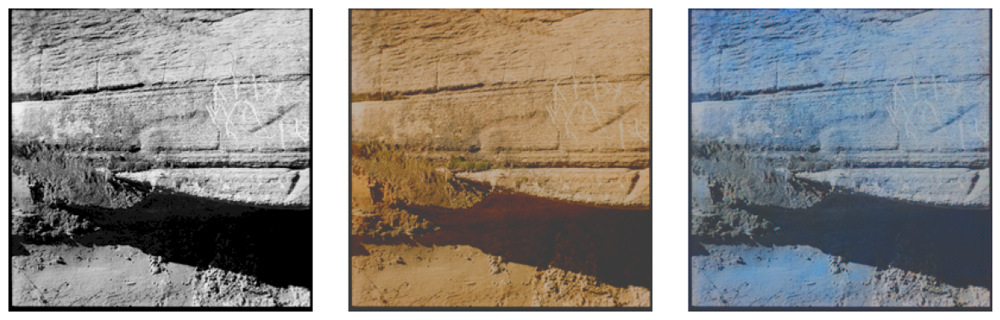

In [18]:
import cv2
fnames = sorted(val)
file_id=100
fig = plt.figure(figsize=(15,10))
plt.imshow(infer(fnames[file_id]))
plt.axis("off");

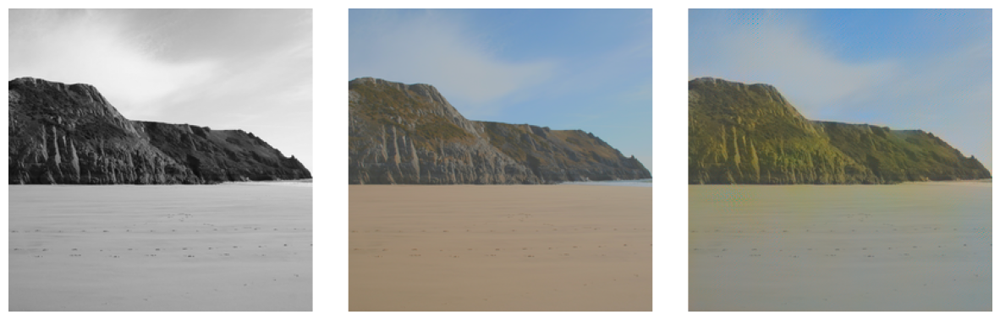

In [19]:
import cv2
fnames = sorted(val)
file_id=107
fig = plt.figure(figsize=(15,10))
plt.imshow(infer(fnames[file_id]))
plt.axis("off");

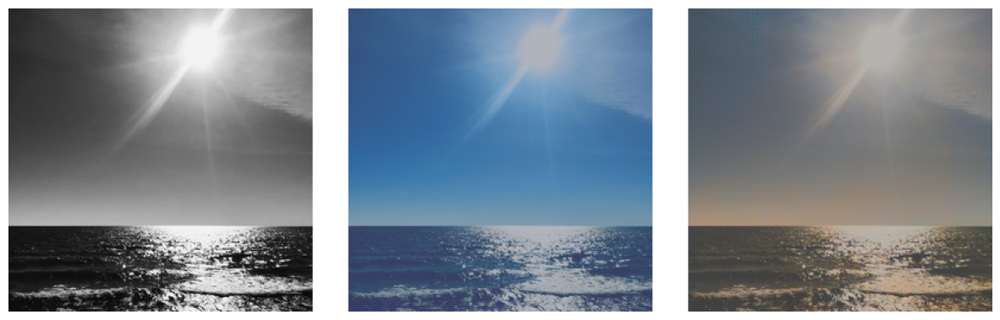

In [20]:
import cv2
fnames = sorted(val)
file_id=1007
fig = plt.figure(figsize=(15,10))
plt.imshow(infer(fnames[file_id]))
plt.axis("off");

libpng warning: iCCP: known incorrect sRGB profile


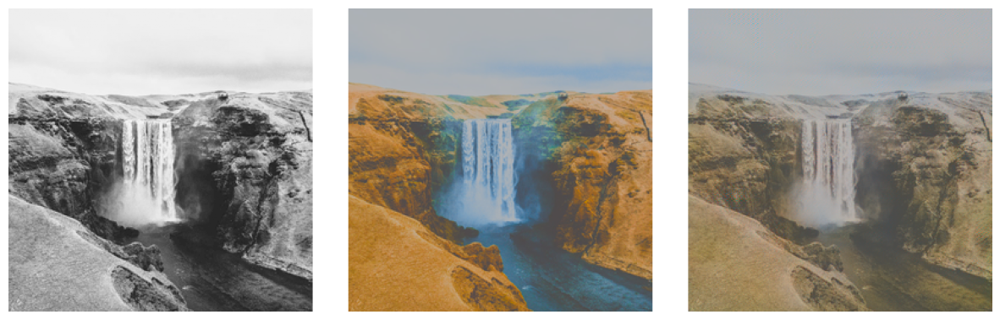

In [21]:
import cv2
fnames = sorted(val)
file_id=1010
fig = plt.figure(figsize=(15,10))
plt.imshow(infer(fnames[file_id]))
plt.axis("off");

libpng warning: iCCP: known incorrect sRGB profile


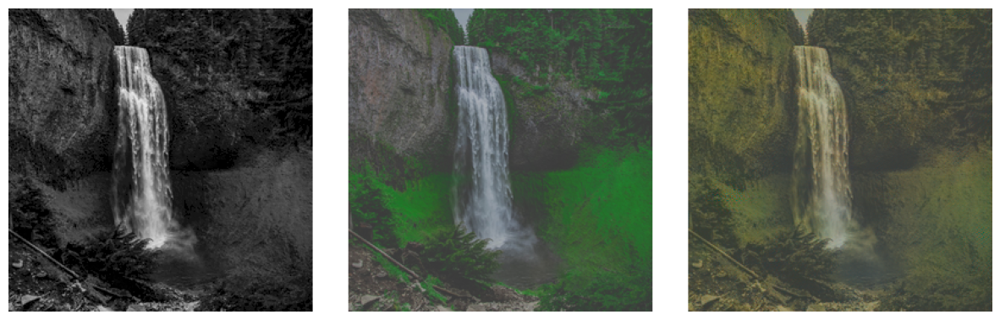

In [22]:
import cv2
fnames = sorted(val)
file_id=2000
fig = plt.figure(figsize=(15,10))
plt.imshow(infer(fnames[file_id]))
plt.axis("off");

libpng warning: iCCP: known incorrect sRGB profile


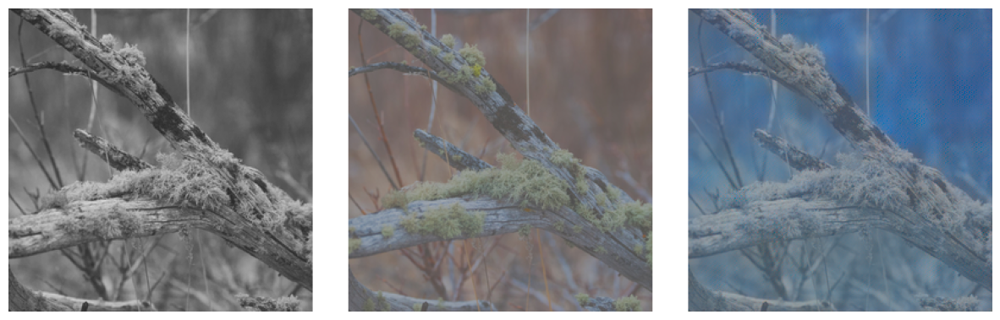

In [23]:
import cv2
fnames = sorted(val)
file_id=2700
fig = plt.figure(figsize=(15,10))
plt.imshow(infer(fnames[file_id]))
plt.axis("off");

libpng warning: iCCP: known incorrect sRGB profile


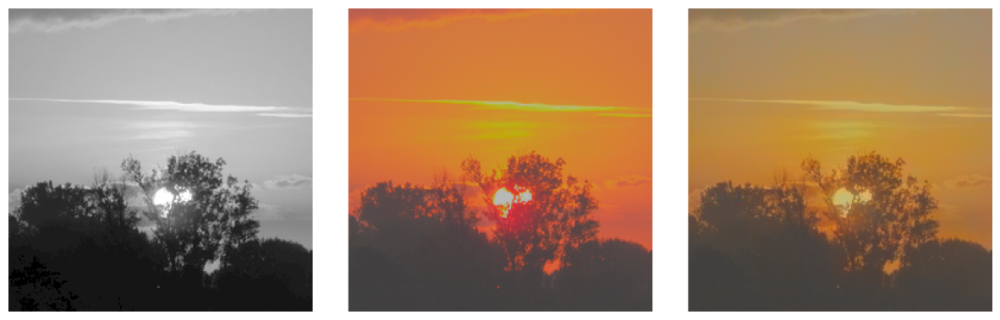

In [26]:
import cv2
fnames = sorted(val)
file_id=2018
fig = plt.figure(figsize=(15,10))
plt.imshow(infer(fnames[file_id]))
plt.axis("off");


libpng warning: iCCP: known incorrect sRGB profile


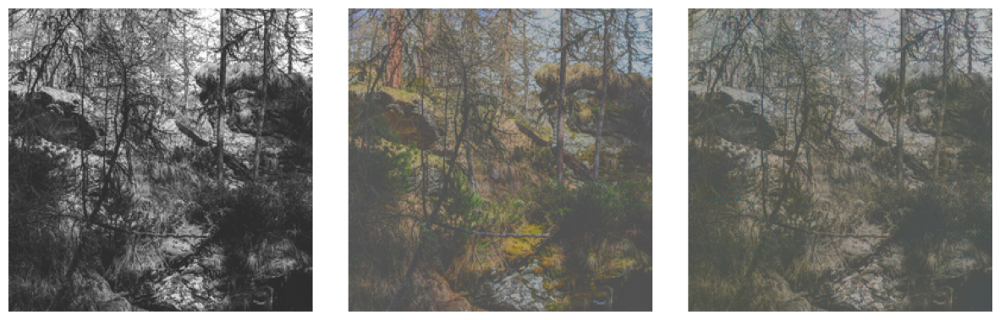

In [25]:
import cv2
fnames = sorted(val)
file_id=2022
fig = plt.figure(figsize=(15,10))
plt.imshow(infer(fnames[file_id]))
plt.axis("off");

libpng warning: iCCP: known incorrect sRGB profile


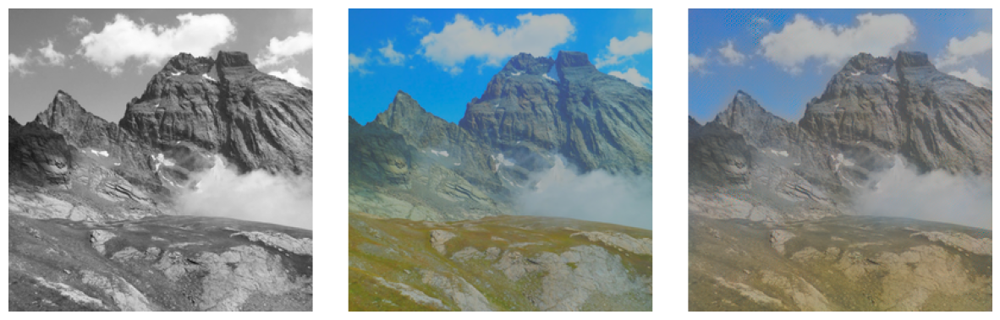

In [29]:
import cv2
fnames = sorted(val)
file_id=2027
fig = plt.figure(figsize=(15,10))
plt.imshow(infer(fnames[file_id]))
plt.axis("off");



libpng warning: iCCP: known incorrect sRGB profile


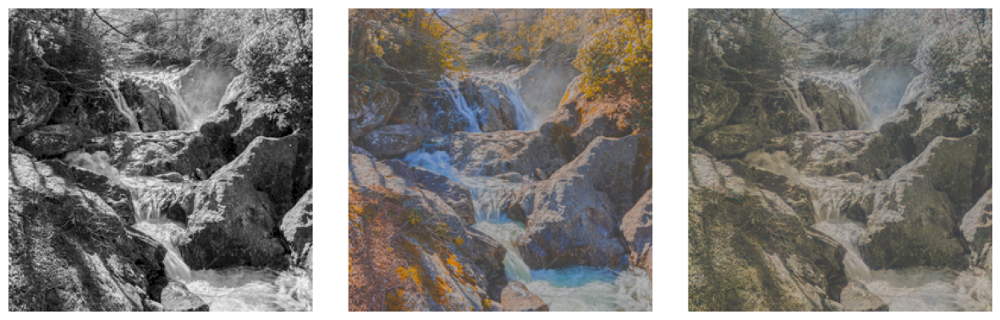

In [28]:
import cv2
fnames = sorted(val)
file_id=50
fig = plt.figure(figsize=(15,10))
plt.imshow(infer(fnames[file_id]))
plt.axis("off");

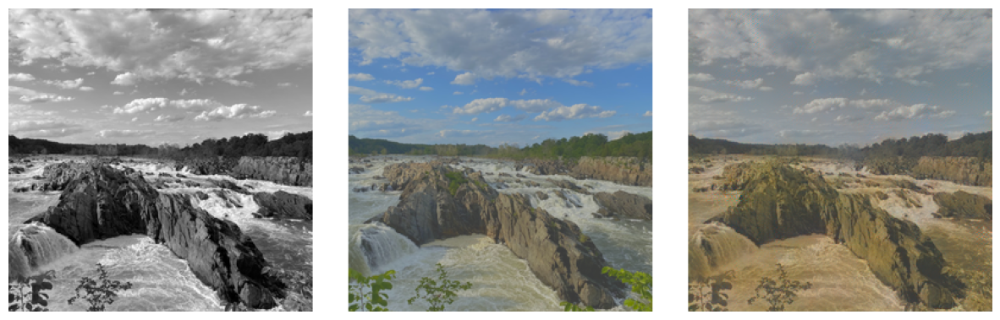

In [40]:
import cv2
fnames = sorted(val)
file_id=823
fig = plt.figure(figsize=(15,10))
plt.imshow(infer(fnames[file_id]))
plt.axis("off");

# fig.savefig(f"{file_id}_bad.jpg", dpi=300)